# Health Insurance Cross-Sell
---

The Insurance All company provides health insurance to your clients as main service for a long time, however, the sales team in interested in offering a new service: A car insurance.

Customers with the company service must pay an amount annually in order to be insured for an eventual incident. Last year, the marketing team conducted a survey with 380,000 people asking about some interest in joining into a new car insurance. The responses from clients who showed interest or not in purchasing an auto insurance were saved in a database with others attributes. The product team selected 127,000 new customers who did not respond to the survey to participate in a campaign, in which they will receive an offer of the new car insurance product. The offer will be made by the sales team through phone calls. However, the sales team has the capacity to make 20 thousand calls within the campaign period.

As a Data Scientist, your goal is to build a model that classifies a list of customers, informing the customer's possibility of contracting or not a car insurance. With the solution, the sales team hopes to be able to prioritize people with the greatest interest in the new product and thus optimize the campaign by only making contact with the customers most likely to make a purchase. In addition to the model, a report will be delivered containing the following information:

1. Insights with the most relevant attributes of customers interested in purchasing auto insurance.
2. What percentage of interested customers the sales team will be able to contact making 20,000 calls?
3. By increasing the capacity to 40,000 calls, what percentage of interested customers the sales team will be able to contact?
4. How many calls does sales team need to make to reach 80% of the most likely customers to purchase the car insurance?


> Disclaimer: This is a fictional bussiness case

## PLANNING

### Input

- Predict wheter customer will be interested in the car insurance;
- Database with customers answers and info.

### Output

- Customers interested in car insurance;
- Performance of the model;
- Percentage of the customers reached with calls;
- Report

### Tasks

1. Which customer will be interested in the insurance?
    - Which customers have a DL?
    - What is the vehicle age range with more interested customer?

2. Performance of the model:
    - Cumulative Gain
    - Lift Curve

3. Action plan:
    - Phone Calls with the customers with the highest probability to take out the insurance

## IMPORTS

In [1]:
import pickle
import warnings

import numpy                    as np
import pandas                   as pd
import psycopg2                 as pg

import seaborn                  as sns
import matplotlib.pyplot        as plt

from config                     import DB
from scipy                      import stats     
from typing                     import Union
from IPython.core.display       import HTML, Image

from yellowbrick.features       import Rank1D, Rank2D
from dataprep.eda               import create_report, plot_diff
from kds.metrics                import plot_cumulative_gain, plot_lift
from kds.metrics                import report                                                               as rp

from boruta                     import BorutaPy
from imblearn.combine           import SMOTETomek

from xgboost                    import XGBClassifier
from lightgbm                   import LGBMClassifier
from catboost                   import CatBoostClassifier

import optuna
from optuna.integration         import LightGBMPruningCallback

from sklearn.feature_selection  import RFE
from sklearn.naive_bayes        import GaussianNB
from sklearn.metrics            import roc_auc_score, log_loss
from sklearn.linear_model       import LogisticRegression
from sklearn.neighbors          import KNeighborsClassifier
from sklearn.preprocessing      import MinMaxScaler, RobustScaler
from sklearn.model_selection    import train_test_split, StratifiedKFold
from sklearn.ensemble           import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier

## HELPER FUNCTIONS AND SETTINGS

### Metrics

In [2]:
def categorical_metrics(data: Union[int, str], col: str):
    """
    Shows the the absolute and percent values in categorical variables.

    Args:
        data ([dataframe]): [Insert all categorical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with absolute and percent values]
    """
    
    return pd.DataFrame({'absolute': data[col].value_counts(), 'percent %': data[col].value_counts(normalize = True) * 100 })

In [3]:
def numerical_metrics(numerical_attributes: Union[int, float]):
    """Shows the main values ​​for descriptive statistics in numerical variables.

    Args:
        numerical_attributes ([float64 and int64]): [Insert all numerical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with mean, median, std deviation, skewness, kurtosis, min, max and range]
    """
    
    data_mean = pd.DataFrame(numerical_attributes.apply(np.mean)).T
    data_median = pd.DataFrame(numerical_attributes.apply(np.median)).T
    data_std = pd.DataFrame(numerical_attributes.apply(np.std)).T
    data_min = pd.DataFrame(numerical_attributes.apply(min)).T
    data_max = pd.DataFrame(numerical_attributes.apply(max)).T
    data_range = pd.DataFrame(numerical_attributes.apply(lambda x: x.max() - x.min())).T
    data_q1 = pd.DataFrame(numerical_attributes.apply(lambda x: np.quantile(x, .25))).T
    data_q3 = pd.DataFrame(numerical_attributes.apply(lambda x: np.quantile(x, .75))).T
    data_skew = pd.DataFrame(numerical_attributes.apply(lambda x: x.skew())).T
    data_kurtosis = pd.DataFrame(numerical_attributes.apply(lambda x: x.kurtosis())).T

    num_attributes = pd.concat([data_min,data_max,data_range,data_mean,data_median, data_q1, data_q3,data_std,data_skew,data_kurtosis]).T.reset_index()
    num_attributes.columns = ['Attributes','Min','Max','Range','Mean','Median','Q1','Q3', 'St deviation','Skewness','Kurtosis']

    return num_attributes

In [4]:
def precision_at_k(data: Union[int, float, str], target: str, k: int = 20000):
    """Calculate precision @k
    Args:
        data[Dataframe]: [Dataframe for transformation]
        target[str]: [Target feature]
        k[int]: [Limit value in precision @k]

    Returns:
        [float]: [Precision @k value]
    """

    # reset index
    data = data.reset_index(drop = True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['precision_at_k'] = data[target].cumsum() / data['ranking']

    result = data.loc[k, 'precision_at_k']

    return result


def recall_at_k(data: Union[int, float, str], target: str, k: int = 20000):    
    """Calculate recall @k
    Args:
        data[Dataframe]: [Dataframe for transformation]
        target[str]: [Target feature]
        k[int]: [Limit value in recall @k]

    Returns:
        [float]: [Recall @k value]
    """
    # reset index
    data = data.reset_index(drop = True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['recall_at_k'] = data[target].cumsum() / data[target].sum()
    result = (data.loc[k, 'recall_at_k'])*100

    return result

### Plots

In [5]:
def correlation_ascending(data: Union[int, float, str], col: str, method: str):
    """Generates a correlation matrix of each numerical variables in ascending order.

    Args:
        data ([dataFrame]): [The dataframe of the EDA]
        col ([object]): [The column selected]
        method ([string]): [The method used, it can be ‘pearson’, ‘kendall’ or ‘spearman’]

    Returns:
        [Image]: [The correlation matrix plot made with seaborn]
    """

    # correlation
    num_attributes = data.select_dtypes(include = ['int64', 'float64'])
    correlation = num_attributes.corr(method = method)

    correlation_asc = correlation[col].sort_values(ascending=False).to_frame()
    correlation_asc.columns = ['']
    correlation_asc.drop(col, axis=0, inplace=True)
    plot = sns.heatmap( correlation_asc, annot=True, cmap='rocket').set_title(col);
    
    return plot

In [6]:
def correlation_matrix(data: Union[int, float], cols_drop: str, method: str):
    """Generates a correlation matrix of numerical variables

    Args:
        data ([DataFrame]): [The dataframe of the EDA]
        cols_drop ([list]): [Cols to drop]
        method ([string]): [The method used, it can be ‘pearson’, ‘kendall’ or ‘spearman’]

    Returns:
        [Image]: [The correlation matrix plot made with seaborn]
    """
    
    # correlation
    num_attributes = data.select_dtypes(include = ['int64', 'float64'])
    num_attributes = num_attributes.drop(columns = cols_drop )
    correlation = num_attributes.corr(method = method)

    # plot
    ax = sns.heatmap(correlation, fmt = '.2f', vmin = -1, vmax = 1, annot = True, cmap = 'magma', square = True)

    return ax

In [7]:
def cramers_v(categorical_attributes: Union[str, int]):
    """Calculates Cramer's V

    Args:
        categorical_attributes ([DataFrame]): [The dataframe with all categorical features]


    Returns:
        [Dict]: [Dictionary with cramer's V]
    """

    cat_attributes_list = categorical_attributes.columns.tolist()

    corr_dict={}

    for i in range(len(cat_attributes_list)):
        corr_list=[]
        for j in range(len(cat_attributes_list)):
            ref=cat_attributes_list[i]
            feat=cat_attributes_list[j]
            cm = pd.crosstab(categorical_attributes[ref], categorical_attributes[feat]).to_numpy()
            n = cm.sum()
            r, k = cm.shape
            chi2 = stats.chi2_contingency(cm)[0]
            chi2corr = max(0, chi2 - (k-1)*(r-1)/(n-1))
            kcorr = k - (k-1)**2/(n-1)
            rcorr = r - (r-1)**2/(n-1)
            corr = np.sqrt((chi2corr/n) / (min(kcorr-1, rcorr-1)))
            corr_list.append(corr)
        
        corr_dict[ref]= corr_list
    
    return corr_dict

In [8]:
def highlight_max(s):
    # Only apply highlight in int and float
    if s.dtype == np.object:
        is_max = [False for _ in range(s.shape[0])]
    else:
        is_max = s == s.max()
    return ['background: #F15854' if cell else '' for cell in is_max]

In [9]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    plt.style.use('tableau-colorblind10')
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    display(HTML('<style>.container { width:100% !important; }</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)
    sns.set()

jupyter_settings()

Populating the interactive namespace from numpy and matplotlib


In [10]:
def multiple_histplots(data: Union[int, float, str], rows: int, cols: int):
    """
    Shows a matrix with hisplots of selected features.

    Args:
        data ([dataframe]): [Insert all categorical attributes in the dataset]
        rows ([int]): [Insert the number of rows of the subplot]
        cols ([int]): [Insert the number of columns of the subplot]

    Returns:
        [Image]: [A matrix plot with histplots]
    """

    for i, col in enumerate(data.columns, 1):
        plt.subplot(rows, cols, i)
        ax = sns.histplot(data[col], kde = True)
        plt.ylabel('')
        plt.style.use('tableau-colorblind10')

    return ax

In [11]:
def percentage(ax,data: Union[str, int, float]):
    """Shows percentage in countplots

    Args:
        ax: [Variable name of the plot]
        data ([DataFrame]): [Dataframe of the countplot]


    Returns:
        [Dict]: [Dictionary with cramer's V]
    """

    for p in ax.patches:
        height = p.get_height()
        len_data = len(data)
        ax.text(p.get_x()+p.get_width()/2.,
                height,
                '{:1.2f}%'.format(height/len_data*100),
                ha="center")

In [12]:
def plot_with_target(target_x: Union[int, float, str], target_y: Union[int, float, str], col: str, position_x: int, position_y: int, label_x: str, label_y: str):
    """
    Create some histplots with target feature.

    Args:
        target_x ([dataframe]): [Dataframe with all numerical features and positive target]
        target_y ([dataframe]): [Dataframe with all numerical features and negative target]
        col ([str]): [Name of the feature of the plot]
        position_x ([int]): [Position in the subplot]
        position_y ([int]): [Position in the subplot]
        label_x ([str]): [Name of the label of negative target]
        label_y ([str]): [Name of the label of positive target]

    Returns:
        [Image]: [Histplots of all features with target]
    """

    plt.style.use('tableau-colorblind10')
    ax[position_x, position_y].hist(target_x[col], bins = 50, alpha = 0.5, label = label_x) 
    ax[position_x, position_y].hist(target_y[col], bins = 50, alpha = 0.7, label = label_y) 
    ax[position_x, position_y].legend()
    ax[position_x, position_y].set_title(col)

    return ax

In [13]:
def ranking_plots(models, X_train: Union[int, float, str], y_train: Union[int, float, str], X_test: Union[int, float, str], y_test: Union[int, float, str], verbose: bool = True):
    """Return CV result
    Args:
        models: [ML model for CV]
        X_train[dataframe]: [Train variables]
        y_train[list]: [Target feature list]
        X_test[dataframe]: [Test variables]
        y_test[list]: [Target feature list for test]
        verbose[bool]: [print]

    Returns:
        [Plot]: [Cumulative Gain and Lift Curve]  
    """
    
    
    i = 1
    j = len(models)
    for model in models:
        model_name = type(model).__name__
        if verbose == True: 
            print(f"Calulating curve for model {i}/{j} -> " + model_name)
            print(f"Training model ... ")
            model.fit(X_train, y_train)

        yhat_final = model.predict_proba(X_test)
        yhat = yhat_final[:, 1]
        fig, ax = plt.subplots(1, 2, figsize = (25, 10))
        fig.suptitle(model_name, fontsize = 18)
        
        plt.subplot(1, 2, 1)    
        plot_cumulative_gain(y_test, yhat)
        plt.yticks(np.arange(0, 100, step = 10))

        plt.subplot(1, 2, 2)
        plot_lift(y_test, yhat);
        
        i += 1
    print('Here are your curves:')
    return plt

### Models

In [14]:
def cross_validation(models, target: str, X_train: Union[int, float, str], y_train: Union[int, float, str], kfold: int = 5, k: int = 20000, verbose: bool = True):
    """Return CV result
    
    Args:
        model: [ML model for CV]
        target[str]: [Target feature name]
        X_train[dataframe]: [Train variables]
        y_train[list]: [Target feature list]
        kfold[int]: [Number of data splits]
        k[int] = [at_k value]
        verbose[bool]: [print folding]

    Returns:
        [DataFrame]: [Dataframe with Precision at K and Recall at K]
    """
    print('Please, wait a moment, Doing CV')
    folds = StratifiedKFold(n_splits = kfold, shuffle = True, random_state = 42)
    precision_list = []
    recall_list = []
    roc_auc_list = []

    model_df = []
    j = 1
    l = len(models)
    
    for model in models:
        model_name = type(model).__name__
        if verbose == True:
            print(f"Folding model {j}/{l} -> " + model_name)

        for train_cv, val_cv in folds.split(X_train, y_train):
            X_train_fold = X_train.iloc[train_cv]
            y_train_fold = y_train.iloc[train_cv]
            X_val_fold = X_train.iloc[val_cv]
            y_val_fold = y_train.iloc[val_cv]

            # fit model
            model.fit(X_train_fold, y_train_fold)
            
            # predict probabilities
            yhat = model.predict_proba(X_val_fold)

            data = X_val_fold.copy()
            data[target] = y_val_fold.copy()
            data['score'] = yhat[:, 1].tolist()
            data = data.sort_values('score', ascending = False)

            # precision at k
            # reset index
            data = data.reset_index(drop = True)
            # create ranking order
            data['ranking'] = data.index + 1
            data['precision_at_k'] = data[target].cumsum() / data['ranking']
            precision = data.loc[k, 'precision_at_k']  
            precision_list.append(precision)

            # recall at k
            # reset index
            data = data.reset_index(drop=True)
            # create ranking order
            data['ranking'] = data.index + 1
            data['recall_at_k'] = data[target].cumsum() / data[target].sum()
            recall = data.loc[k, 'recall_at_k']
            recall_list.append(recall)

            # roc auc
            roc_auc = roc_auc_score(y_val_fold, yhat[:,1])
            roc_auc_list.append(roc_auc)


        df_result = pd.DataFrame({'Model_Name': (model_name),
                                  'Precision @K Mean': np.mean(precision_list).round(3),
                                  'Precision @K STD': np.std(precision_list).round(3),
                                  'Recall @K Mean': np.mean(recall_list).round(3),
                                  'Recall @K STD': np.std(recall_list).round(3),
                                  'ROCAUC @K Mean': np.mean(recall_list).round(3),
                                  'ROCAUC @K STD': np.std(recall_list).round(3)}, index = [0])
        
        j += 1

        model_df.append(df_result)
        cv_result = pd.concat(model_df)
    print('Finished, check the results')

    return cv_result

In [15]:
def data_preparation(data, cols_selected):
    """Return a dataframe with encoding, rescaling and drop
    Args:
        dataframe: [Dataframe without transformation]
        cols_selected: [Column with dropped features]

    Returns:
        [DataFrame]: [Prepared Dataframe]
    """
    
    # Encoding
    # vehicle_age - One Hot Encoding
    data = pd.get_dummies(data, prefix = ['car_age'], columns = ['vehicle_age'])

    # gender - Label Encoding
    # vehicle_damage - Label Encoding
    question_ohe = {'No': 0, 'Yes': 1}
    gender_ohe = {'Male': 0, 'Female': 1}

    data['gender'] = data['gender'].map(gender_ohe)
    data['vehicle_damage'] = data['vehicle_damage'].map(question_ohe)

    # region_code - Frequency Encoding
    # policy_sales_channel - Frequency Encoding
    fe_cols = ['policy_sales_channel', 'region_code']

    for col in ['region_code', 'policy_sales_channel']:
        fe_encoding = (data.groupby(col).size())/len(data)
        data.loc[:, col] = data[col].map(fe_encoding)

    # Rescaling data
    mms = MinMaxScaler()
    rs = RobustScaler()

    min_max_scaler = ['age', 'vintage']
    robust_scaler = ['annual_premium']

    for col in min_max_scaler:
        data[[col]] = mms.fit_transform(data[[col]].values)

    for col in robust_scaler:
        data[[col]] = rs.fit_transform(data[[col]].values)

    # Drop Columns
    data = data.drop(columns = cols_selected)

    return data

In [16]:
def metrics_at_k(models, target: str, X_train: Union[int, float, str], y_train: Union[int, float, str], X_val: Union[int, float, str], y_val: Union[int, float, str], k = 20000, verbose = True):
    """Return Metrics of the model
    
    Args:
        model: [ML model for CV]
        target[str]: [Target feature name]
        X_train[dataframe]: [Train variables]
        y_train[list]: [Target feature list]
        X_val[dataframe]: [Validation variables]
        y_val[list]: [Target feature list]
        k[int] = [at_k value]
        verbose[bool]: [print training]

    Returns:
        [DataFrame]: [Dataframe with Precision at K and Recall at K]
    """
    print('Please, wait a moment - Doing ML')
    model_df = []
    i = 1
    j = len(models)

    for model in models:
        model_name = type(model).__name__
        if verbose == True:
            print(f"Training model {i}/{j} -> " + model_name)
        model.fit(X_train, y_train)

        # probabilities prediction
        yhat = model.predict_proba(X_val)

        # copy data
        data = X_val.copy()
        data[target] = y_val.copy()

        # propensity score
        data['score'] = yhat[:, 1].tolist()

        # sort clients by propensity score
        data = data.sort_values('score', ascending = False)
        # precision at k
        # reset index
        data = data.reset_index(drop = True)
        # create ranking order
        data['ranking'] = data.index + 1
        data['precision_at_k'] = data[target].cumsum() / data['ranking']
        precision = data.loc[k, 'precision_at_k']  

        # recall at k
        # reset index
        data = data.reset_index(drop=True)
        # create ranking order
        data['ranking'] = data.index + 1
        data['recall_at_k'] = data[target].cumsum() / data[target].sum()
        recall = data.loc[k, 'recall_at_k']
        
        # roc auc
        roc_auc = roc_auc_score(y_val, yhat[:,1])

        i += 1

        df_result = pd.DataFrame({'Model_Name': model_name, 
                                  'Precision @K': precision,
                                  'Recall @K': recall,
                                  'ROCAUC': roc_auc}, index = [0])

        model_df.append(df_result)
        final_result = pd.concat(model_df)
    print('Finished, check the results')

    return final_result

### Hyperparameter Fine Tuning

In [17]:
def objective_adb(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3), 
                 }

    cv = StratifiedKFold(n_splits = splits, shuffle = True, random_state = 42)

    cv_scores = np.empty(5)
    for idx, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        
        y_train, y_val = y[train_idx], y[val_idx]

        model = AdaBoostClassifier(**param_grid)
        model.fit(X_train, y_train)
        preds = model.predict_proba(X_val)
        cv_scores[idx] = log_loss(y_val, preds)

    return np.mean(cv_scores)

In [18]:
def objective_et(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'max_features': trial.suggest_categorical('max_features', ['sqrt']),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
                 }

    cv = StratifiedKFold(n_splits = splits, shuffle = True, random_state = 42)

    cv_scores = np.empty(5)
    for idx, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = ExtraTreesClassifier(**param_grid)
        model.fit(X_train, y_train)
        preds = model.predict_proba(X_val)
        cv_scores[idx] = log_loss(y_val, preds)

    return np.mean(cv_scores)

In [19]:
def objective_gb(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
                 }

    cv = StratifiedKFold(n_splits = splits, shuffle = True, random_state = 42)

    cv_scores = np.empty(5)
    for idx, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        
        y_train, y_val = y[train_idx], y[val_idx]

        model = GradientBoostingClassifier(**param_grid)
        model.fit(X_train, y_train)
        preds = model.predict_proba(X_val)
        cv_scores[idx] = log_loss(y_val, preds)

    return np.mean(cv_scores)

In [20]:
def objective_lgbm(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 20, 3000, step = 20),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 200, 10000, step = 100),
        'lambda_l1': trial.suggest_int('lambda_l1', 0, 100, step = 5),
        'lambda_l2': trial.suggest_int('lambda_l2', 0, 100, step = 5),
        'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 15),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.2, 0.95, step = 0.1),
        'bagging_freq': trial.suggest_categorical('bagging_freq', [1]),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.2, 0.95, step=0.1),
                 }

    cv = StratifiedKFold(n_splits = splits, shuffle = True, random_state = 42)

    cv_scores = np.empty(5)
    for idx, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        
        y_train, y_val = y[train_idx], y[val_idx]

        model = LGBMClassifier(objective = 'binary', **param_grid)
        model.fit(  X_train, y_train, eval_set = [(X_val, y_val)], eval_metric = 'logloss',
                    early_stopping_rounds = 50, callbacks = [LightGBMPruningCallback(trial, 'binary_logloss')]
                 )
        preds = model.predict_proba(X_val)
        cv_scores[idx] = log_loss(y_val, preds)

    return np.mean(cv_scores)

### Settings

In [21]:
# round
pd.options.display.float_format = '{:.3f}'.format

# ignoring errors
warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

seed = 42

homepath = '/home/gutto/Repos/Insurance-Cross-Sell/'

## DATA


This dataset is avaliable [here](https://www.kaggle.com/anmolkumar/health-insurance-cross-sell-prediction).

**Data fields**

- **id**: Unique ID for the customer
- **gender**: Gender of the customer
- **age**: Age of the customer
- **driving_license**: 0 : Customer does not have DL, 1 : Customer already has DL
- **region_code**: Unique code for the region of the customer
- **previously_insured**: 1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance
- **vehicle_age**: Age of the Vehicle
- **vehicle_damage**: 1 : Customer got his/her vehicle damaged in the past, 0 : Customer didn't get his/her vehicle damaged in the past
- **annual_premium**: The amount customer needs to pay as premium in the year
- **policy_sales_channel**: Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.
- **vintage**: Number of Days, Customer has been associated with the company
- **response**: 1 : Customer is interested, 0 : Customer is not interested 


### Database

In [22]:
# Credentials
host = DB.host
port = DB.port
database = DB.database
username = DB.username
pwd = DB.pwd

In [23]:
conn = pg.connect(user = username, password = pwd, host = host, port = port, database = database)

query_schema = '''
    SELECT *
    FROM pa004.users u  INNER JOIN pa004.vehicle v on (u.id = v.id)
                        INNER JOIN pa004.insurance i on (u.id = i.id)
'''

df_raw = pd.read_sql(query_schema, conn)

conn.close()

df_raw.to_pickle(homepath + 'data/processed/df_raw.pkl')

## 1. DATA DESCRIPTION


### 1.1 Dataset First Look


In [24]:
df1 = pd.read_pickle(homepath + 'data/processed/df_raw.pkl')

In [25]:
df1.head(2)

,id,gender,age,region_code,policy_sales_channel,id,driving_license,vehicle_age,vehicle_damage,id,previously_insured,annual_premium,vintage,response
0,7,Male,23,11.000,152.000,7,1,< 1 Year,Yes,7,0,23367.000,249,0
1,13,Female,41,15.000,14.000,13,1,1-2 Year,No,13,1,31409.000,221,0


### 1.2 Organizing Columns


In [26]:
# removing duplicated columns
df1 = df1.loc[:, ~ df1.columns.duplicated()]

In [27]:
df1.head().T

,0,1,2,3,4
id,7,13,18,31,39
gender,Male,Female,Female,Female,Male
age,23,41,25,26,45
region_code,11.000,15.000,35.000,8.000,8.000
policy_sales_channel,152.000,14.000,152.000,160.000,124.000
driving_license,1,1,1,1,1
vehicle_age,< 1 Year,1-2 Year,< 1 Year,< 1 Year,1-2 Year
vehicle_damage,Yes,No,No,No,Yes
previously_insured,0,1,1,0,0
annual_premium,23367.000,31409.000,46622.000,2630.000,42297.000


### 1.3 Data Dimensions


In [28]:
print(f'Number of rows: {df1.shape[0]} \nNumber of columns: {df1.shape[1]}')


Number of rows: 381109 
Number of columns: 12


### 1.4 Check Data

In [29]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int64  
 3   region_code           381109 non-null  float64
 4   policy_sales_channel  381109 non-null  float64
 5   driving_license       381109 non-null  int64  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   previously_insured    381109 non-null  int64  
 9   annual_premium        381109 non-null  float64
 10  vintage               381109 non-null  int64  
 11  response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [30]:
df1.isna().sum()

id                      0
gender                  0
age                     0
region_code             0
policy_sales_channel    0
driving_license         0
vehicle_age             0
vehicle_damage          0
previously_insured      0
annual_premium          0
vintage                 0
response                0
dtype: int64

This DataFrame doesn't have NA and the dtypes look right

In [31]:
df1['response'].value_counts(normalize = True)

0   0.877
1   0.123
Name: response, dtype: float64

Machine learning algorithms for binary classification generally consider a balance between the target variable of 50-50, in this case it's ~88-12, probably, a data balance will be necessary later.
You can read about it [here](https://towardsdatascience.com/handling-imbalanced-datasets-in-machine-learning-7a0e84220f28)

### 1.5 unique Values

In [32]:
print(f'There are {df1["region_code"].nunique()} unique regions.')
print(f'There are {df1["vehicle_age"].nunique()} unique vehicle ages.')

There are 53 unique regions.
There are 3 unique vehicle ages.


In [33]:
df1['vehicle_age'].unique()

array(['< 1 Year', '1-2 Year', '> 2 Years'], dtype=object)

Vehicle Age: < 1 year, 1-2 years, > 2 years

### 1.6 Descriptive Statistics

#### 1.6.1 Numerical Attributes

In [34]:
num_attributes = df1[['age', 'annual_premium', 'vintage']]
num_result = numerical_metrics(num_attributes)
num_result

,Attributes,Min,Max,Range,Mean,Median,Q1,Q3,St deviation,Skewness,Kurtosis
0,age,20.000,85.000,65.000,38.823,36.000,25.000,49.000,15.512,0.673,-0.566
1,annual_premium,2630.000,540165.000,537535.000,30564.390,31669.000,24405.000,39400.000,17213.132,1.766,34.005
2,vintage,10.000,299.000,289.000,154.347,154.000,82.000,227.000,83.671,0.003,-1.201


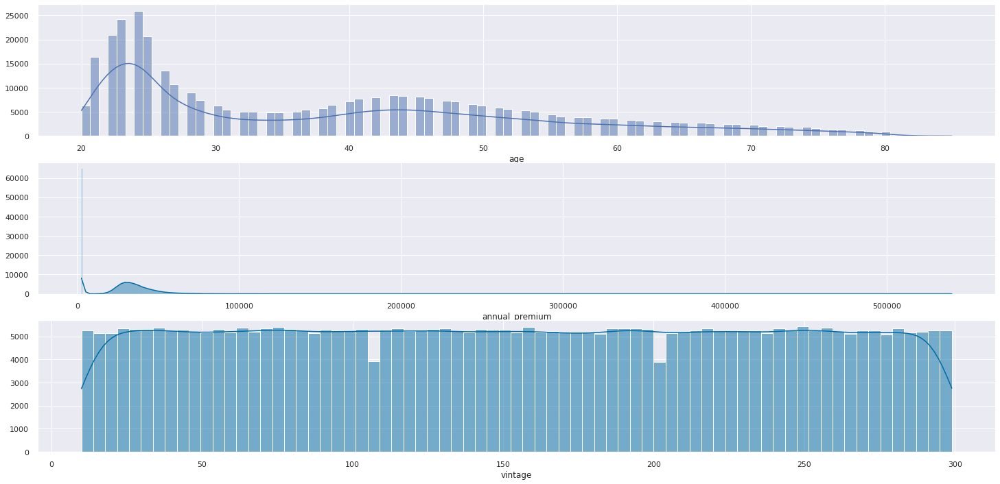

In [35]:
multiple_histplots(df1[['age', 'annual_premium', 'vintage']], 3, 1);

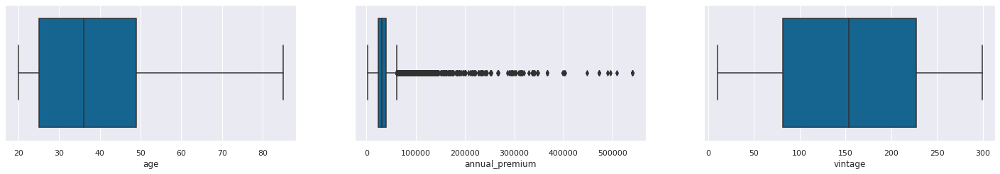

In [36]:
i = 1
for col in num_attributes:
    plt.subplot(3, 3, i)
    ax = sns.boxplot(data = num_attributes, x = col)
    i += 1

#### 1.6.2 Categorical Attributes

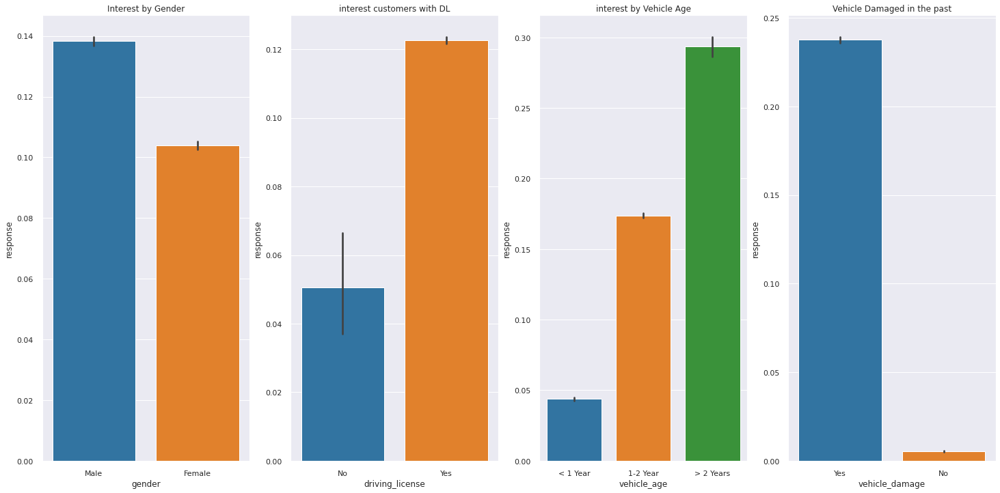

In [37]:
cat_attributes = df1[['gender', 'driving_license', 'vehicle_age', 'vehicle_damage', 'previously_insured', 'response']]

plt.subplot(1, 4, 1)
sns.barplot(x = 'gender', y = 'response', data = cat_attributes, palette = 'tab10')
plt.title('Interest by Gender');

plt.subplot(1, 4, 2)
sns.barplot(x = 'driving_license', y = 'response', data = cat_attributes, palette = 'tab10')
plt.xticks([0,1],['No','Yes']);
plt.title('interest customers with DL');

plt.subplot(1, 4, 3)
sns.barplot(x = 'vehicle_age', y = 'response', data = cat_attributes, palette = 'tab10')
plt.title('interest by Vehicle Age');

plt.subplot(1, 4, 4)
sns.barplot(x = 'vehicle_damage', y = 'response', data = cat_attributes, palette = 'tab10')
plt.title('Vehicle Damaged in the past');

##### 1.6.2.1 Gender

In [38]:
categorical_metrics(cat_attributes, 'gender')

,absolute,percent %
Male,206089,54.076
Female,175020,45.924


##### 1.6.2.2 Driving License

In [39]:
categorical_metrics(cat_attributes, 'driving_license')

,absolute,percent %
1,380297,99.787
0,812,0.213


##### 1.6.2.3 Vehicle Age

In [40]:
categorical_metrics(cat_attributes, 'vehicle_age')

,absolute,percent %
1-2 Year,200316,52.561
< 1 Year,164786,43.239
> 2 Years,16007,4.200


##### 1.6.2.4 Vehicle Damage

In [41]:
categorical_metrics(cat_attributes, 'vehicle_damage')

,absolute,percent %
Yes,192413,50.488
No,188696,49.512


##### 1.6.2.5 Previously Insured

In [42]:
categorical_metrics(cat_attributes, 'previously_insured')

,absolute,percent %
0,206481,54.179
1,174628,45.821


##### 1.6.2.6 Target

In [43]:
categorical_metrics(cat_attributes, 'response')

,absolute,percent %
0,334399,87.744
1,46710,12.256


Only 12.256% of the clients shows interest in vehicle insurance

### 1.7 Data Filtering

#### 1.7.1 Rows

- `Annual_premium` is the only feature with possible outliers, these high values ​​appear to be a characteristic of the business, so they cannot be removed. 
- Only 41 customers without `Driving License` demonstrated interest in car insurance, considering this dataset with 381.109 people, this value is insignificant, however, this information could be relevant in the ML modelling, so I will keep this customers.

in this database, there is no need for row filtering.

#### 1.7.2 Columns

in this database, there is no need for columns filtering, all the features are relevant in this bussiness problem.

### 1.8 Save State

In [44]:
df1.to_pickle(homepath + 'data/processed/df1.pkl')


## 2. FEATURE ENGINEERING

### 2.1 Split Data


In [45]:
df_total = pd.read_pickle(homepath + 'data/processed/df1.pkl')

# Train -> 70%
# Test -> 20%
# Validation -> 10%
x_train, x_test = train_test_split(df_total , test_size = 0.2, random_state = seed)

# if train = 80% x dataset, then val = 0.1/0.8 = 0.125
# 0.125 x 0.8 = 0.1
x_train, x_val = train_test_split(x_train, test_size = 0.125, random_state = seed)

### 2.2 Feature Creation

`insurance_age`: According [Forbes Advisor](https://www.forbes.com/advisor/car-insurance/rates-age-and-gender/), age and gender are the factors with the greatest impact on the price of insurance, with age being the most relevant factor. The high car insurance rates that younger drivers pay start to go down at age 25 and the best rates are between 50s and early 60 years if the driver has a good record and start to rise again around 65. The main factors are the lack of experience in driving, greater impulsiveness, alcohol use, distractive driving and high speed for young people and greater likelihood of illness and risk of being injured or killed in a car crash in older drivers. After all this explanation, I propose this feature, with a scale from 1 to 5, 1 being the smallest weight in the insurance value and 5 being the biggest cost;

`vehicle_age`: just changing the description for a snakecase type;

`premium_per_vintage`: The highest value of the `vintage` is 299 days, approximately 10 months, as the `annual_premium` is the cost per year, it's possible to create a relation between these features if consider the amount of time the customer is associated with the database;

`premium_per_age`: Just a relation between the price and the customer age.

In [46]:
for dataframe in [x_train, x_test, x_val]:
    # vehicle_age
    dataframe['vehicle_age'] = dataframe['vehicle_age'].apply(lambda x: 'over_2_years' if x == '> 2 Years' else 
                                                            'between_1_2_year' if x == '1-2 Year' else 
                                                            'below_1_year')
    
    # premium_per_vintage
    dataframe['premium_per_vintage'] = dataframe['annual_premium']/dataframe['vintage']
    
    # insurance age
    dataframe['insurance_age'] = dataframe['age'].apply(lambda x: 5 if (x >= 20 and x <= 25) else
                                                      3 if (x >= 26 and x <= 35) else
                                                      2 if (x >= 36 and x < 50) else
                                                      1 if (x >= 50 and x < 65) else
                                                      4)

# premium_per_age
df_premium_age_train, df_premium_age_test, df_premium_age_val = [dataframe.loc[:, ['age', 'annual_premium']].groupby('age').mean().reset_index() for dataframe in [x_train, x_test, x_val]]
df_premium_age_train.columns = ['age', 'premium_per_age']
df_premium_age_test.columns = ['age', 'premium_per_age']
df_premium_age_val.columns = ['age', 'premium_per_age']
x_train = pd.merge(x_train, df_premium_age_train, on = 'age', how = 'left')
x_test = pd.merge(x_test, df_premium_age_test, on = 'age', how = 'left')
x_val = pd.merge(x_val, df_premium_age_val, on = 'age', how = 'left')

In [ ]:
df2 = pd.concat([x_train, x_test, x_val], ignore_index = True)

### 2.3 Save State

In [ ]:
df2.to_pickle(homepath + 'data/processed/df2.pkl')
x_train.to_pickle(homepath + 'data/processed/x_train.pkl')
x_test.to_pickle(homepath + 'data/processed/x_test.pkl')
x_val.to_pickle(homepath + 'data/processed/x_val.pkl')

## 3. EXPLORATORY DATA ANALYSIS

### 3.1 Dataset Checkpoint


In [ ]:
df3 = pd.read_pickle(homepath + 'data/processed/df2.pkl')

eda_encoding = {0: 'No', 1: 'Yes'}

for col in ['previously_insured', 'driving_license']:
    df3[col] = df3[col].map(eda_encoding)

### 3.2 Mind Map

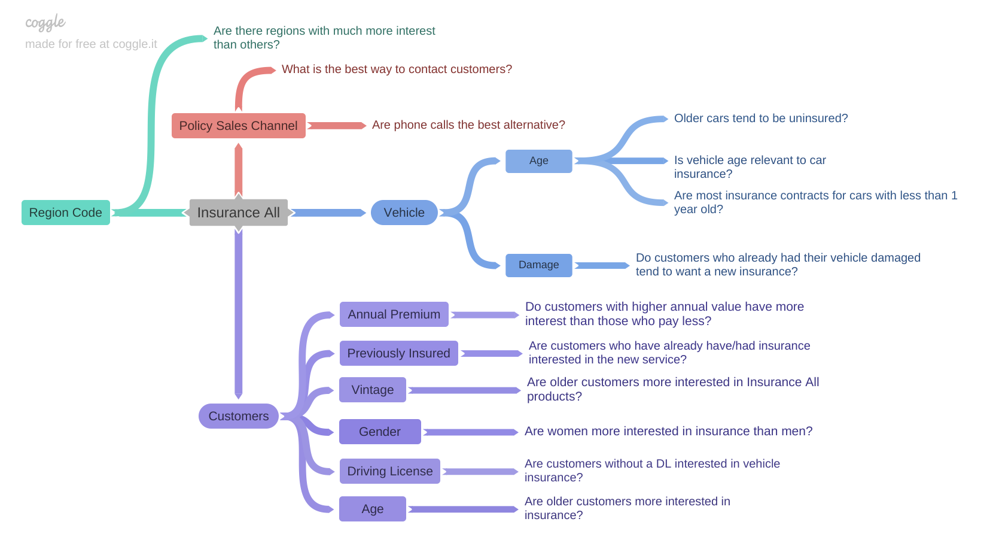

In [ ]:
Image(homepath + 'reports/figures/mind_map.png')

### 3.3 EDA Report

In [ ]:
report = create_report(df3, title = 'Insurance Cross Sell');
report.save(homepath + 'reports/report.html');

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/2696 [00:00<?, ?it/s]

Report has been saved to /home/gutto/Repos/Insurance-Cross-Sell/reports/report.html!


#### 3.3.1 Report Insights

- `age` is right skewed;
- `region_code` is left skewed;
- `policy_sales_channel` is left skewed;
- `annual_premium` is right skewed;
- `premium_per_vintage` is right skewed;
- `premium_per_age` is right skewed;

### 3.4 Univariate Analysis

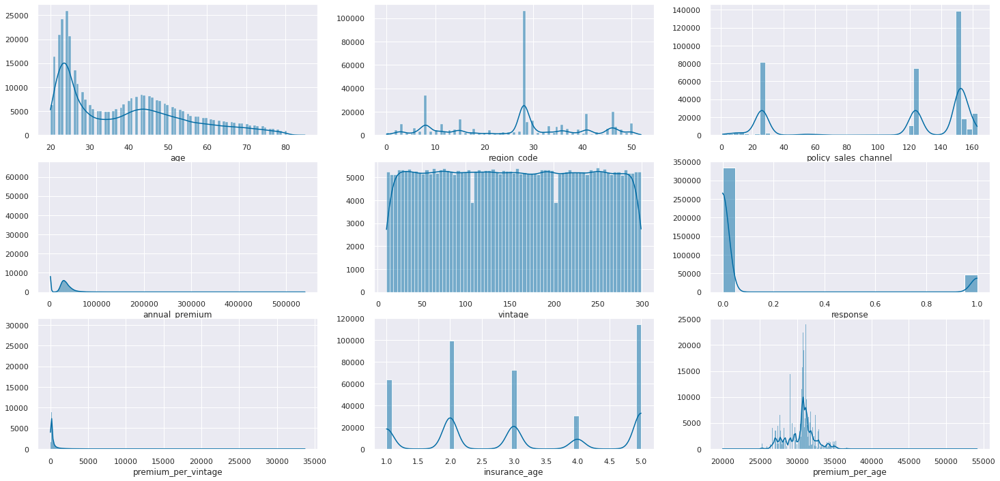

In [ ]:
univariate_numerical = df3.select_dtypes(include=['int64', 'float64'])
cols_drop = ['id']
univariate_numerical = univariate_numerical.drop(columns = cols_drop)
univariate_numerical.columns

multiple_histplots(univariate_numerical, 3, 3);

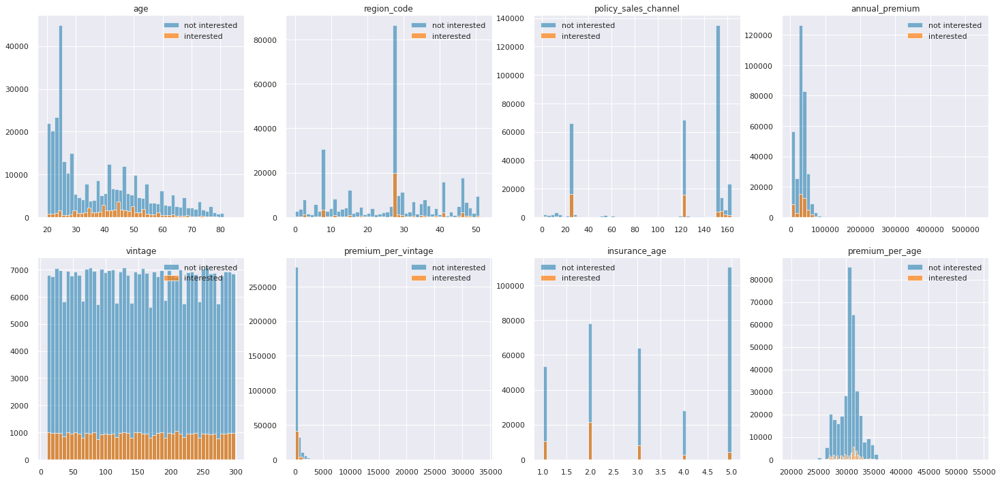

In [ ]:
# creating two datasets, one with interested and other with not interested hue
numerical_interested = univariate_numerical[univariate_numerical['response'] == 1]
numerical_not_interested = univariate_numerical[univariate_numerical['response'] == 0]

# creating subplots
fig, ax = plt.subplots(2, 4)

plot_with_target(numerical_not_interested, numerical_interested,
                 'age', 0, 0, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'region_code', 0, 1, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'policy_sales_channel', 0, 2, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'annual_premium', 0, 3, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'vintage', 1, 0, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'premium_per_vintage', 1, 1, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'insurance_age', 1, 2, 'not interested', 'interested');

plot_with_target(numerical_not_interested, numerical_interested,
                 'premium_per_age', 1, 3, 'not interested', 'interested');

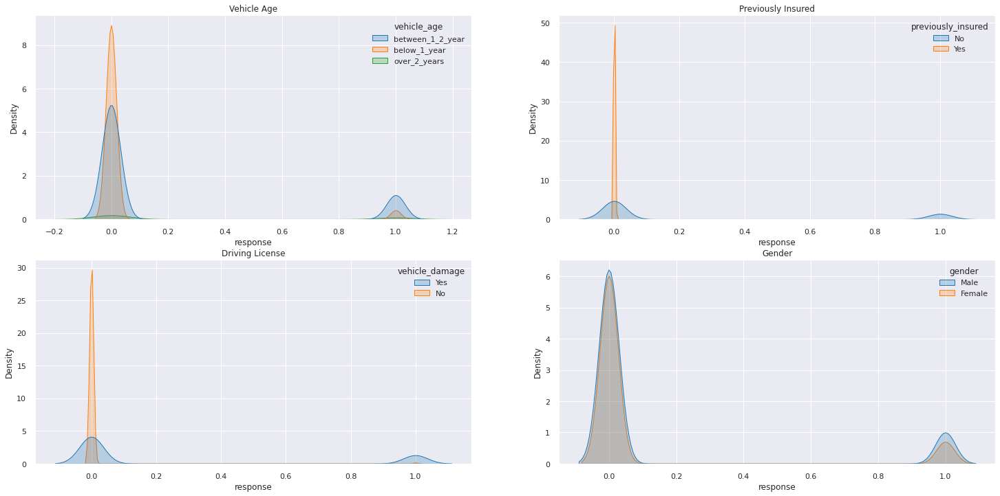

In [ ]:
cat_target = df3[['previously_insured', 'driving_license', 'gender', 'vehicle_age', 'vehicle_damage', 'response']]

plt.subplot(2, 2, 1)
sns.kdeplot(x = 'response', hue = 'vehicle_age', data = cat_target, shade = True, palette = 'tab10')
plt.title('Vehicle Age');

plt.subplot(2, 2, 2)
sns.kdeplot(x = 'response', hue = 'previously_insured', data = cat_target, shade = True, palette = 'tab10')
plt.title('Previously Insured');

plt.subplot(2, 2, 3)
sns.kdeplot(x = 'response', hue = 'vehicle_damage', data = cat_target, shade = True, palette = 'tab10')
plt.title('Driving License');

plt.subplot(2, 2, 4)
sns.kdeplot(x = 'response', hue = 'gender', data = cat_target, shade = True, palette = 'tab10')
plt.title('Gender');

### 3.5 Bivariate Analysis

#### 3.5.1 Pairplot

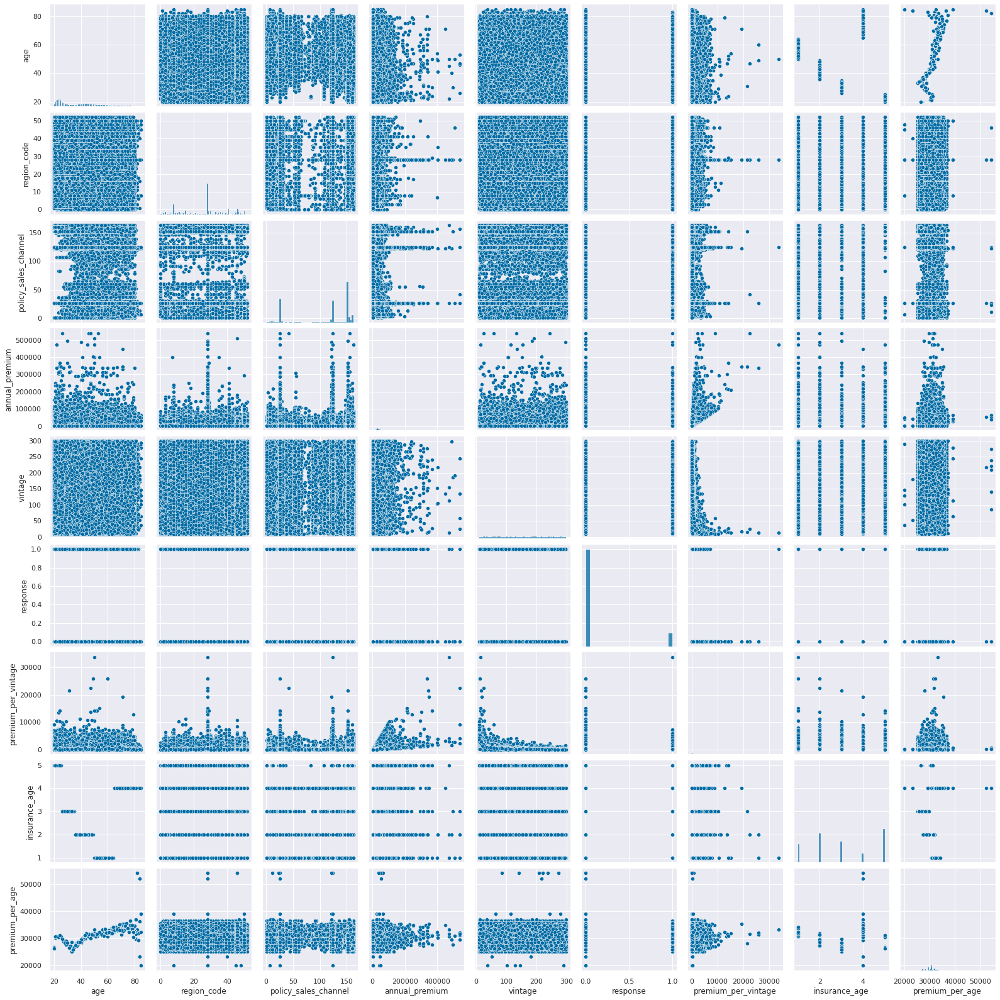

In [ ]:
df3_pairplot = df3.drop('id', axis = 1)
sns.pairplot(df3_pairplot);

#### H1. Men have more than 51% vehicle damages in the past.
**True** Vehicle Damage with men represent 58.6% of the total.

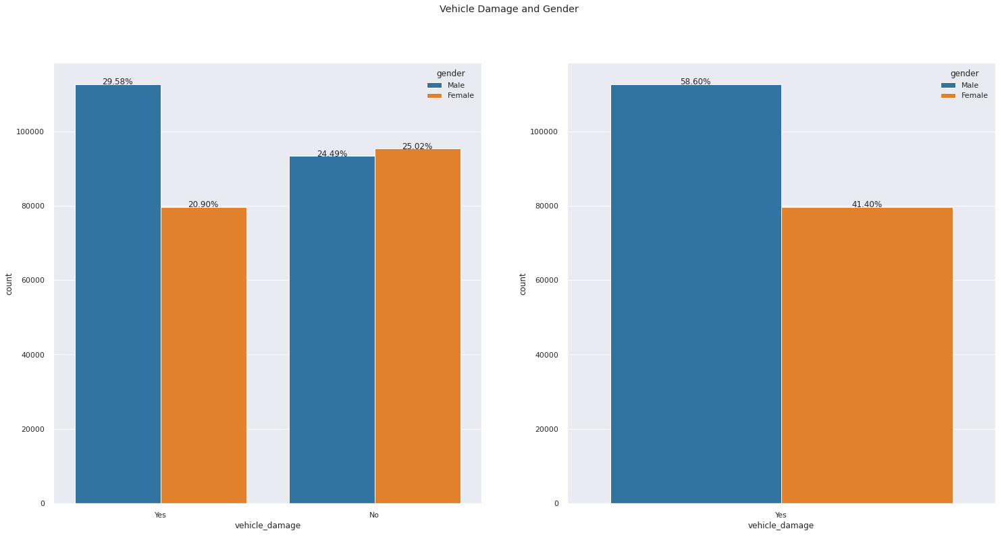

In [ ]:
h1_aux = df3[['gender', 'vehicle_damage']]
h1_aux_2 = h1_aux[h1_aux['vehicle_damage'] == 'Yes']

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Vehicle Damage and Gender')

plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'vehicle_damage', hue = 'gender', data = h1_aux, palette = 'tab10')
percentage(ax, h1_aux)

plt.subplot(1, 2, 2)
ax2 = sns.countplot(x = 'vehicle_damage', hue = 'gender', data = h1_aux_2, palette = 'tab10')
percentage(ax2, h1_aux_2)

#### H2. Customers with more than 65 years has the highest annual premium
**True** Customers with more than 65 year pay more, especially in 80's.

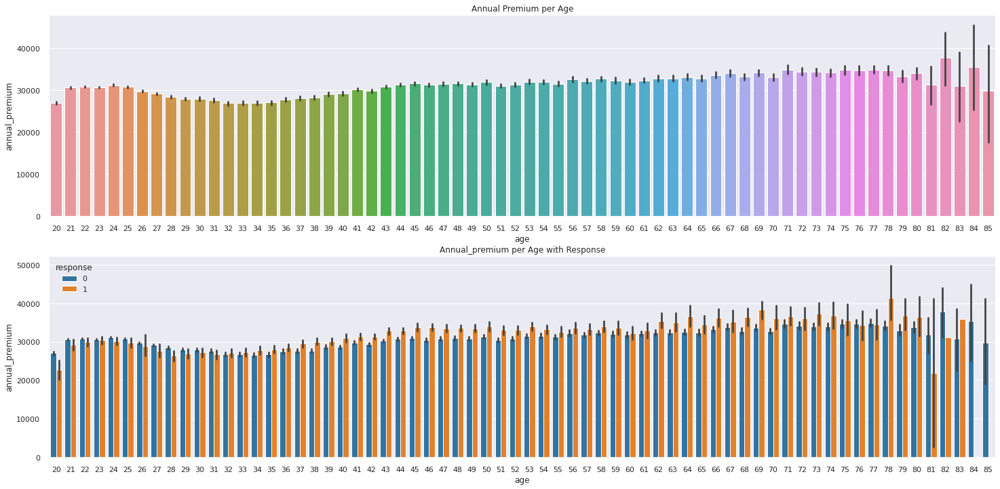

In [ ]:
h2_aux = df3[['age', 'annual_premium', 'response']]

# creating subplots
plt.subplot(2, 1, 1)
ax = sns.barplot(y = 'annual_premium', x = 'age', data = h2_aux)
ax.set_title('Annual Premium per Age');

plt.subplot(2, 1, 2)
ax2 = sns.barplot(y = 'annual_premium', x = 'age', data = h2_aux, palette = 'tab10', hue = 'response')
ax2.set_title('Annual_premium per Age with Response');

#### H3. More than 80% of the customers who already have/had a car insurance are not interested in the product.
**True** 99.91% of the customers who already have/had a car insurance are not interested in the product.

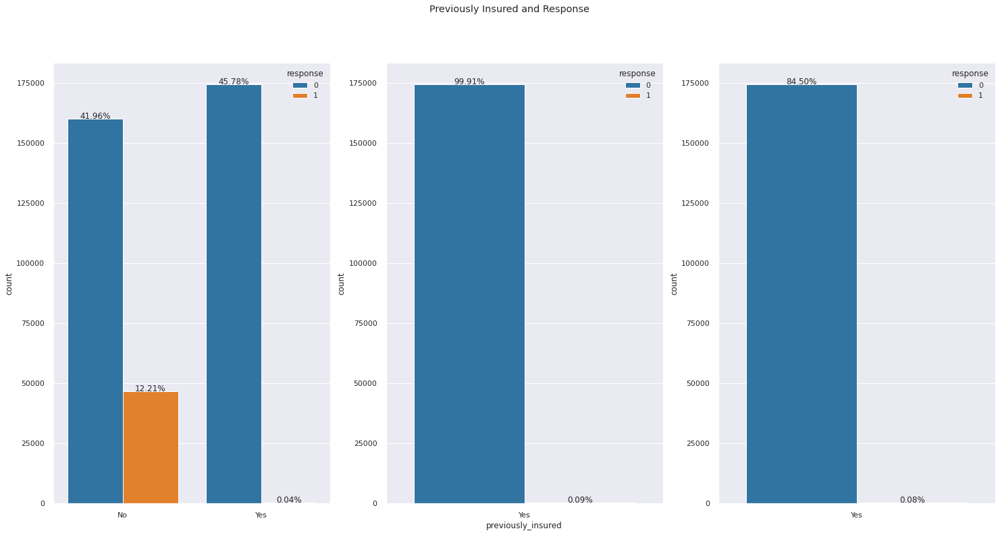

In [ ]:
h3_aux = df3[['previously_insured', 'response']]
h3_aux_2 = h3_aux[h3_aux['previously_insured'] == 'Yes']
h3_aux_3 = h3_aux[h3_aux['previously_insured'] == 'No']

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Previously Insured and Response')

plt.subplot(1, 3, 1)
ax = sns.countplot(x = 'previously_insured', hue = 'response', data = h3_aux, palette = 'tab10')
percentage(ax, h3_aux)
ax.set_xlabel('')

plt.subplot(1, 3, 2)
ax2 = sns.countplot(x = 'previously_insured', hue = 'response', data = h3_aux_2, palette = 'tab10')
percentage(ax2, h3_aux_2)

plt.subplot(1, 3, 3)
ax3 = sns.countplot(x = 'previously_insured', hue = 'response', data = h3_aux_2, palette = 'tab10')
percentage(ax3, h3_aux_3)
ax3.set_xlabel('');

#### H4. Women have more interest in car insurance than men.
**False** Men have more interest but women have/had more vehicle insurance, even if the difference is very small.

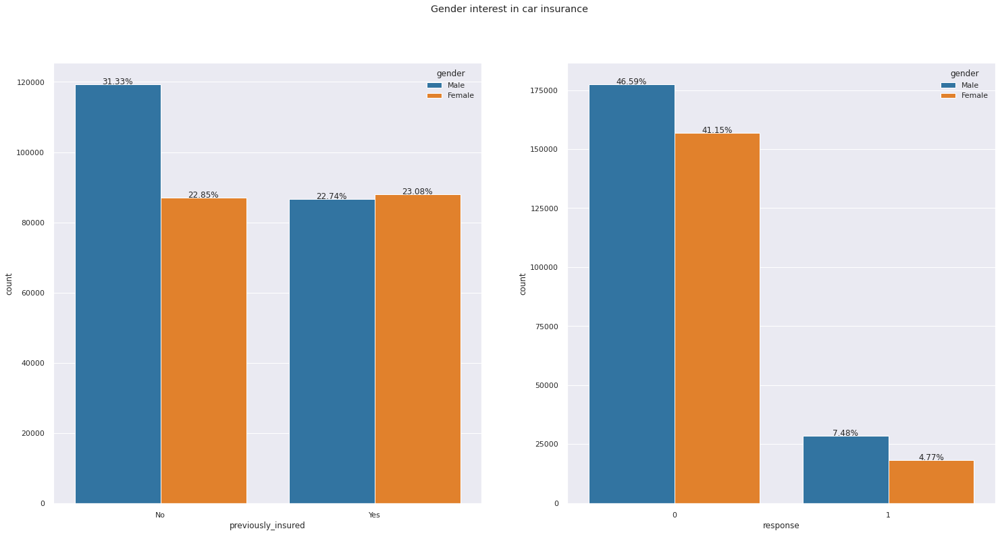

In [ ]:
h4_aux = df3[['gender', 'previously_insured', 'response']]

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Gender interest in car insurance')

plt.subplot(1, 2, 1)

ax = sns.countplot(x = 'previously_insured', hue = 'gender', data = h4_aux, palette = 'tab10')
percentage(ax, h4_aux)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(x = 'response', hue = 'gender', data = h4_aux, palette = 'tab10')
percentage(ax2, h4_aux)

#### H5. Customers after the 60's has more interest than young customers.
**False** Interested customers have between 35 and 55 years old.

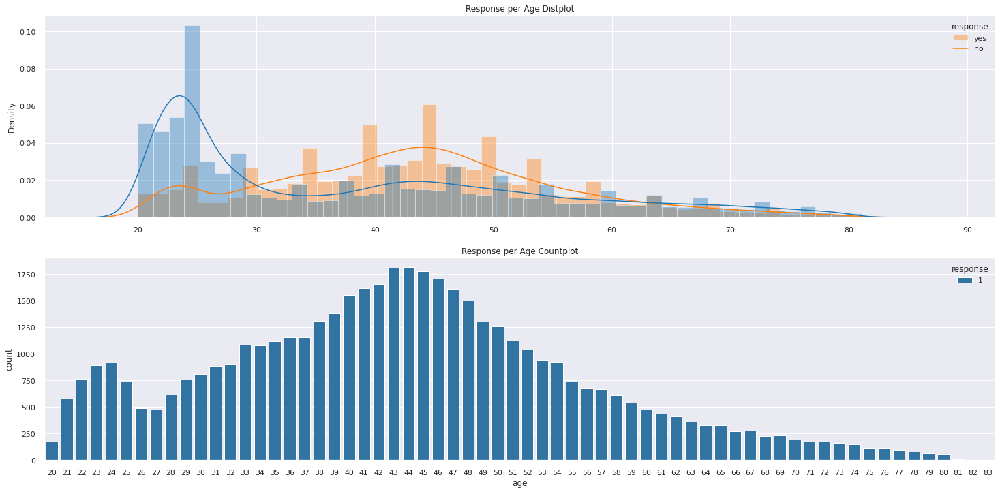

In [ ]:
h5_aux = df3[['age', 'response']]
h5_aux_2 = h5_aux[h5_aux['response'] == 1]

plt.subplot(2, 1, 1)
ax = sns.distplot(h5_aux[h5_aux['response'] == 1]['age'], label = 'yes', color = '#FF7F0E')
ax = sns.distplot(h5_aux[h5_aux['response'] == 0]['age'], label = 'no', color = '#1F77B4')
plt.legend(['yes', 'no'], title = 'response')
ax.set_title('Response per Age Distplot')
ax.set_xlabel('')

plt.subplot(2, 1, 2)
ax2 = sns.countplot(x = 'age', data = h5_aux_2, palette = 'tab10', hue = 'response')
ax2.set_title('Response per Age Countplot');

#saving figure
plt.savefig(homepath + 'reports/figures/h5.png')

#### H6. More than 80% of the interested customers in vehicle insurance already had their vehicle damaged in the past.
**True** 97.90% of the interested customers already had the vehicle damaged in the past.

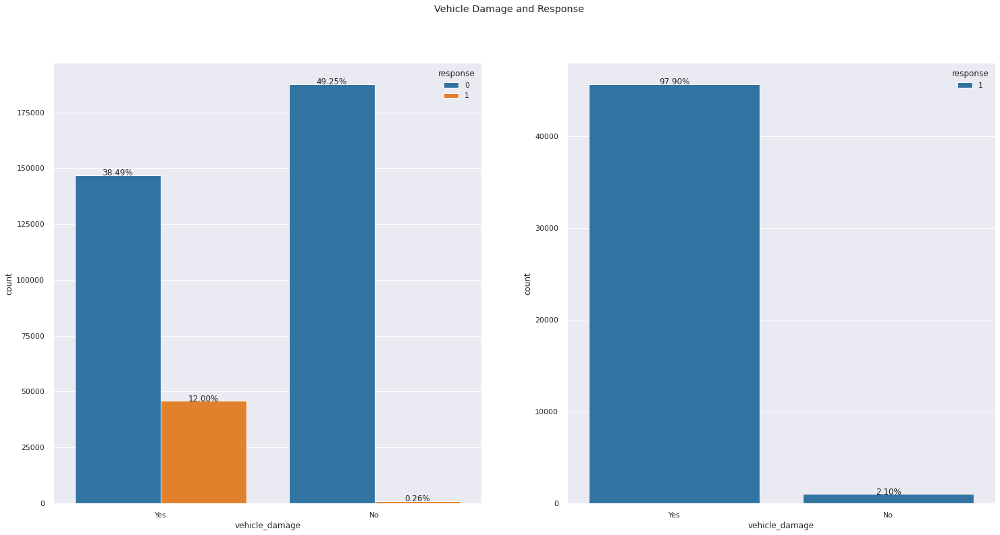

In [ ]:
h6_aux = df3[['response', 'vehicle_damage']]
h6_aux_2 = h6_aux[h6_aux['response'] == 1]

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Vehicle Damage and Response')

plt.subplot(1, 2, 1)
ax = sns.countplot(x = 'vehicle_damage', hue = 'response', data = h6_aux, palette = 'tab10')
percentage(ax, h6_aux)

plt.subplot(1, 2, 2)
ax2 = sns.countplot(x = 'vehicle_damage', hue = 'response', data = h6_aux_2, palette = 'tab10')
percentage(ax2, h6_aux_2)

#### H7. More than 70% of interested customers have a vehicle for less than 1 year.
**False** Only 15.42% of the customer have interest. People with vehicles with age between 1-2 year have much more interest (74.52%)

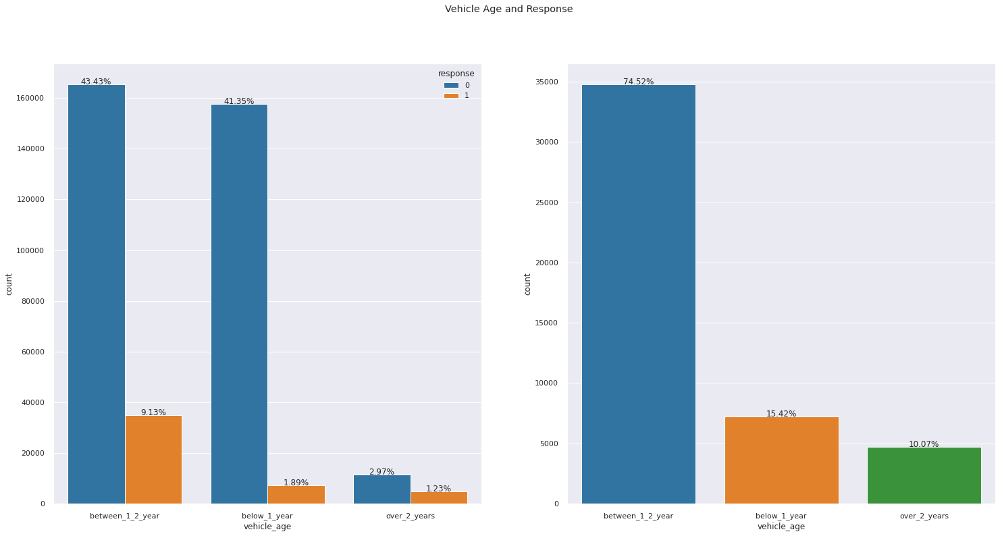

In [ ]:
h7_aux = df3[['vehicle_age', 'response']]
h7_aux_2 = h7_aux[h7_aux['response'] == 1]

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Vehicle Age and Response')

plt.subplot(1, 2, 1)
ax2 = sns.countplot(x = 'vehicle_age', hue = 'response', data = h7_aux, palette = 'tab10')
percentage(ax2, h7_aux)

plt.subplot(1, 2, 2)
ax = sns.countplot(x = 'vehicle_age', data = h7_aux_2, palette = 'tab10')
percentage(ax, h7_aux_2)

#saving figure
plt.savefig(homepath + 'reports/figures/h7.png')

#### H8. Customer that paid between $25000-$44999 last year represents more than half of the people interest in vehicle insurance.
**True** Customer that paid between $25000-$44999 represents 57.13% of the total interested customers.

In [ ]:
df_annual_premium = df3[['annual_premium']]
annual_premium_result = numerical_metrics(df_annual_premium)
annual_premium_result

,Attributes,Min,Max,Range,Mean,Median,Q1,Q3,St deviation,Skewness,Kurtosis
0,annual_premium,2630.000,540165.000,537535.000,30564.390,31669.000,24405.000,39400.000,17213.132,1.766,34.005


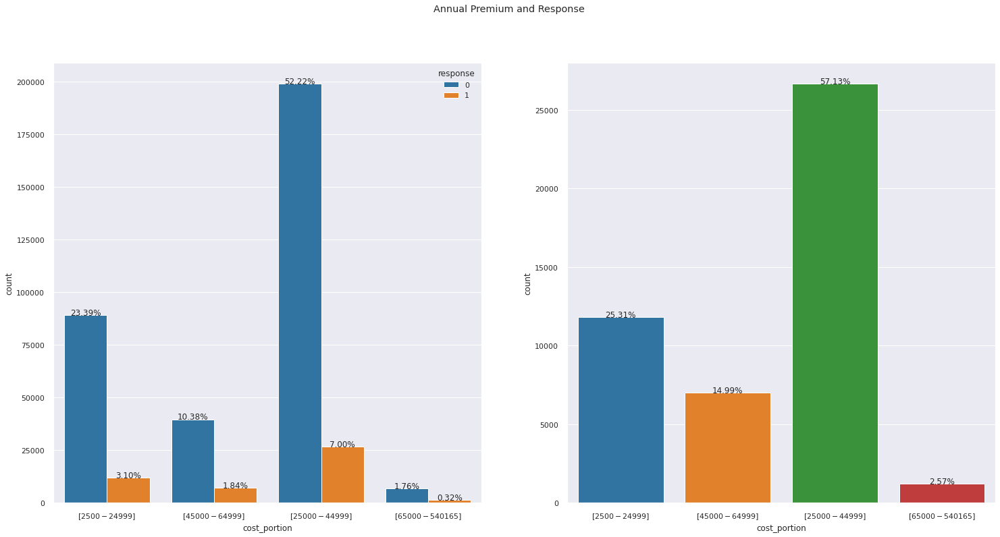

In [ ]:
h8_aux = df3[['annual_premium', 'response']]
h8_aux['cost_portion'] = h8_aux['annual_premium'].apply(lambda x: '[$2500-$24999]' if x < 25000 else
                                                                  '[$25000-$44999]' if x >= 25000 and x < 45000 else
                                                                  '[$45000-$64999]' if x >= 45000 and x < 65000 else
                                                                  '[$65000-$540165]'
                                                        )

h8_aux_2 = h8_aux[h8_aux['response'] == 1]

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Annual Premium and Response')

plt.subplot(1, 2, 1)
ax2 = sns.countplot(x = 'cost_portion', hue = 'response', data = h8_aux, palette = 'tab10')
percentage(ax2, h8_aux)

plt.subplot(1, 2, 2)
ax = sns.countplot(x = 'cost_portion', data = h8_aux_2, palette = 'tab10')
percentage(ax, h8_aux_2)


#saving figure
plt.savefig(homepath + 'reports/figures/h8.png')

#### H9. Customers with less time in the company has less interest in car insurace.
**False** The company's time is not related to the interest in insurance

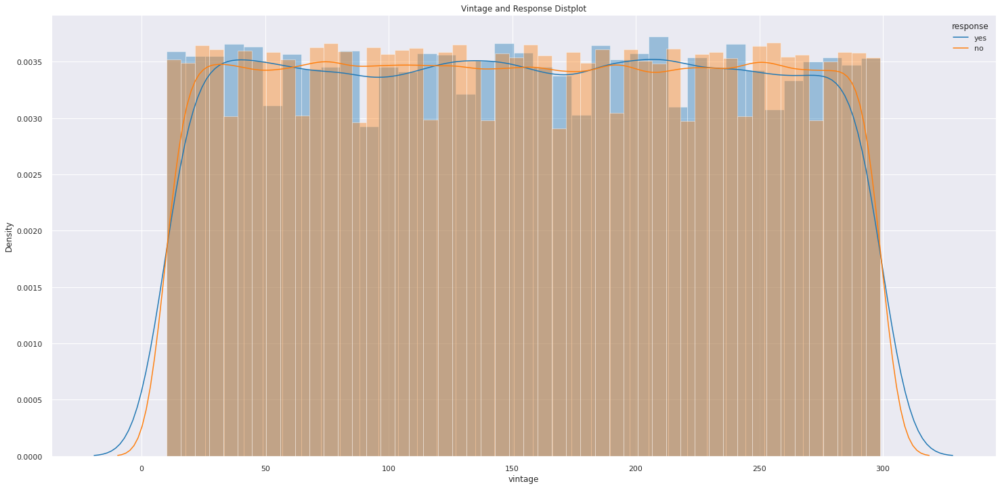

In [ ]:
h9_aux = df3[df3['response'] == 1]['vintage']
h9_aux_2 = df3[df3['response'] == 0]['vintage']
ax = sns.distplot(h9_aux, color = '#1F77B4')
ax = sns.distplot(h9_aux_2, color = '#FF7F0E')
plt.legend(['yes', 'no'], title = 'response')
ax.set_title('Vintage and Response Distplot');

#### H10. Customers without driving license have no interest in car insurance.
**True** 94.95% of the customers without driving license have no interest in car insurance, that value corresponds to only 771 clients without interest and 41 with interest in car insurance.

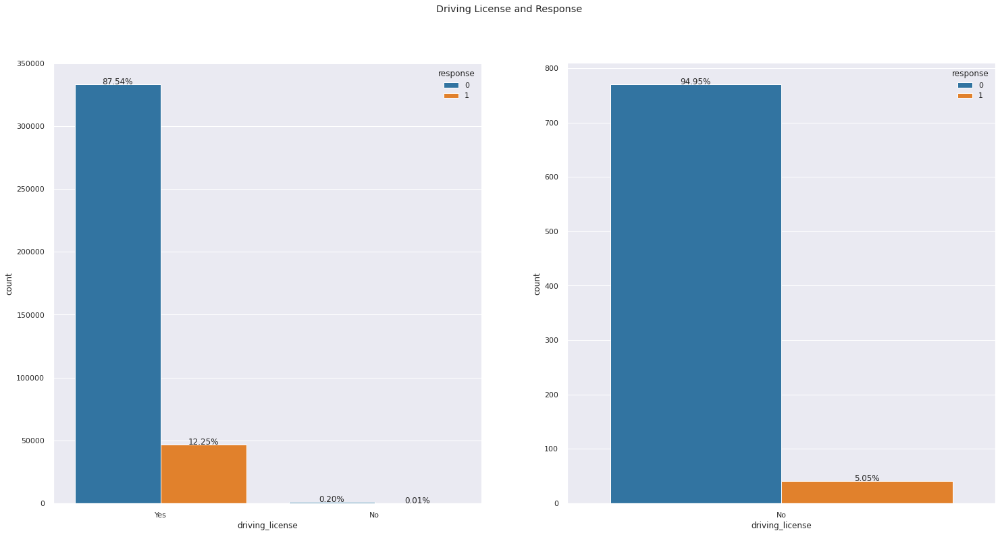

In [ ]:
h10_aux = df3[['driving_license', 'response']]
h10_aux_2 = h10_aux[h10_aux['driving_license'] == 'No']
h10_aux_3 = h10_aux[h10_aux['driving_license'] == 'Yes']

# creating subplots
fig, ax = plt.subplots()
fig.suptitle('Driving License and Response')

plt.subplot(1, 2, 1)
ax2 = sns.countplot(x = 'driving_license', hue = 'response', data = h10_aux, palette = 'tab10')
percentage(ax2, h10_aux)

plt.subplot(1, 2, 2)
ax = sns.countplot(x = 'driving_license', hue = 'response', data = h10_aux_2, palette = 'tab10')
percentage(ax, h10_aux_2)

In [ ]:
categorical_metrics(h10_aux_2, 'response')

,absolute,percent %
0,771,94.951
1,41,5.049


In [ ]:
categorical_metrics(h10_aux_3, 'response')

,absolute,percent %
0,333628,87.728
1,46669,12.272


### 3.6 Multivariate Analysis

#### 3.6.1 Numerical Features

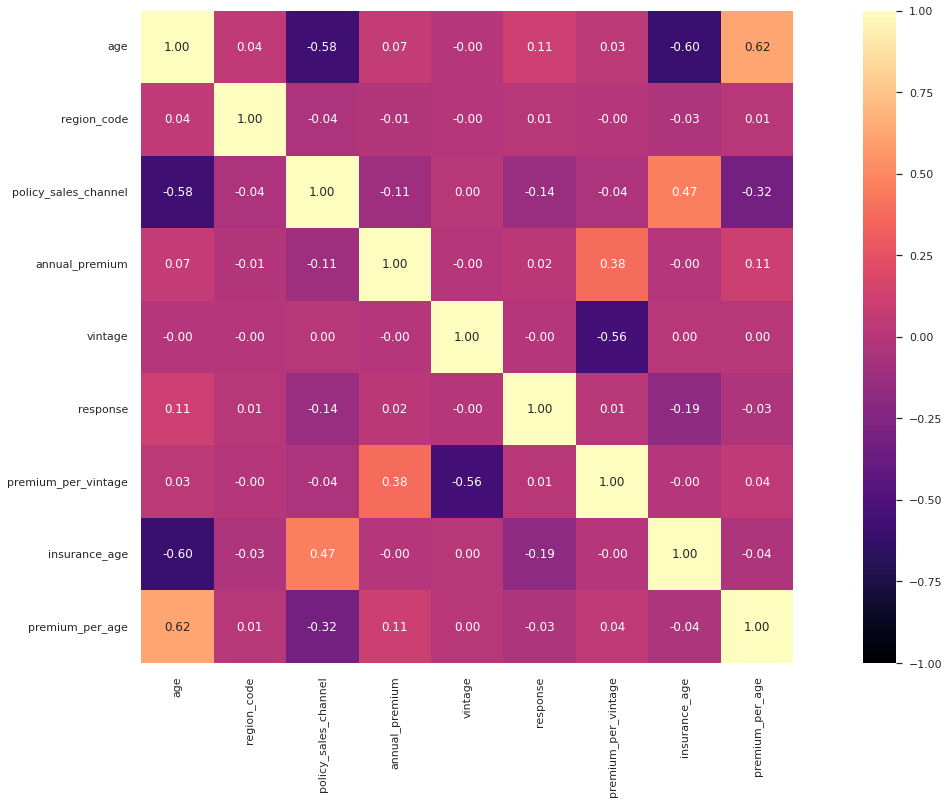

In [ ]:
correlation_matrix(df3, cols_drop,'pearson');

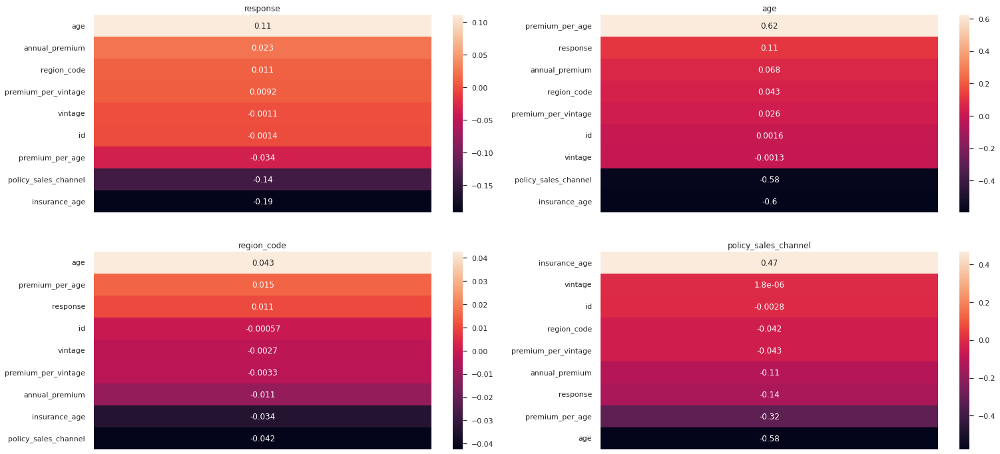

In [ ]:
# creating subplots
fig, ax = plt.subplots()

plt.subplot(2, 2, 1)
correlation_ascending(df3, 'response', 'pearson');

plt.subplot(2, 2, 2)
correlation_ascending(df3, 'age', 'pearson');

plt.subplot(2, 2, 3)
correlation_ascending(df3, 'region_code', 'pearson');

plt.subplot(2, 2, 4)
correlation_ascending(df3, 'policy_sales_channel', 'pearson');


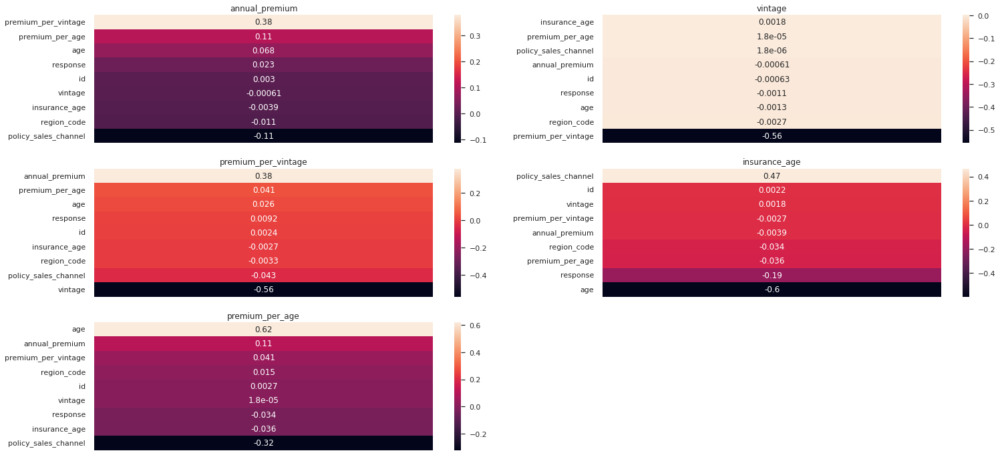

In [ ]:
# creating subplots
fig, ax = plt.subplots()

plt.subplot(3, 2, 1)
correlation_ascending(df3, 'annual_premium', 'pearson');

plt.subplot(3, 2, 2)
correlation_ascending(df3, 'vintage', 'pearson');

plt.subplot(3, 2, 3)
correlation_ascending(df3, 'premium_per_vintage', 'pearson');

plt.subplot(3, 2, 4)
correlation_ascending(df3, 'insurance_age', 'pearson');

plt.subplot(3, 2, 5)
correlation_ascending(df3, 'premium_per_age', 'pearson');

#### 3.6.2 Categorical Features

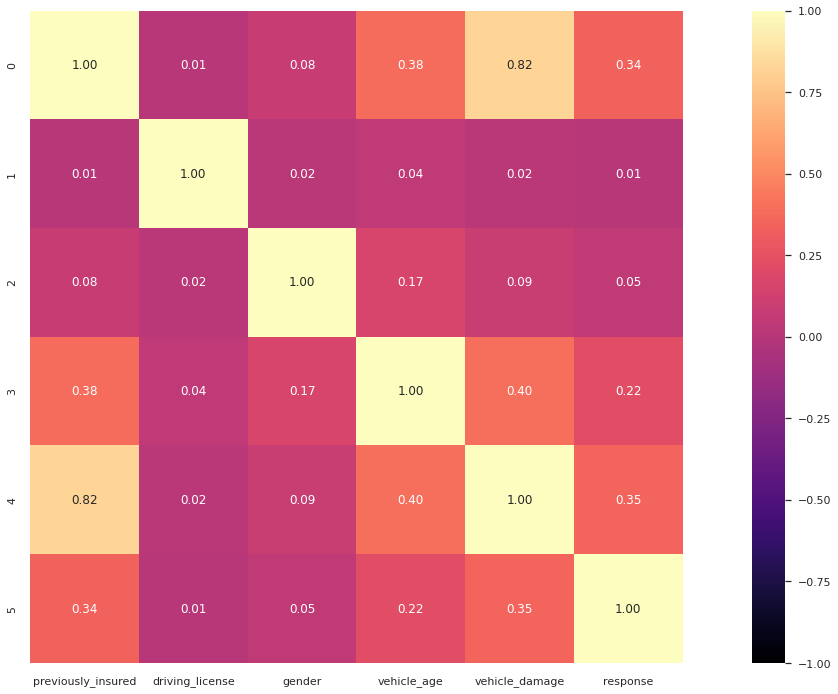

In [ ]:
cat_features = df3[['previously_insured', 'driving_license', 'gender', 'vehicle_age', 'vehicle_damage', 'response']]
cat_corr = pd.DataFrame(cramers_v(cat_features))
sns.heatmap(cat_corr, fmt = '.2f', vmin = -1, vmax = 1, annot = True, cmap = 'magma', square = True);

### 3.7 Save State


In [ ]:
df3.to_pickle(homepath + 'data/processed/df3.pkl')

## 4. DATA PREPARATION

### 4.1 Dataset Checkpoint


In [ ]:
x_train_imb = pd.read_pickle(homepath + 'data/processed/x_train.pkl')
x_test =  pd.read_pickle(homepath + 'data/processed/x_test.pkl')
x_val = pd.read_pickle(homepath + 'data/processed/x_val.pkl')

In [ ]:
x_train_imb.head()

,id,gender,age,region_code,policy_sales_channel,driving_license,vehicle_age,vehicle_damage,previously_insured,annual_premium,vintage,response,premium_per_vintage,insurance_age,premium_per_age
0,238223,Male,39,41.000,26.000,1,between_1_2_year,Yes,0,19840.000,58,1,342.069,2,29028.159
1,358929,Female,45,4.000,124.000,1,between_1_2_year,Yes,0,45910.000,158,1,290.570,2,31548.382
2,376811,Female,69,11.000,120.000,1,between_1_2_year,Yes,0,25323.000,179,0,141.469,4,34002.199
3,98927,Male,38,45.000,124.000,1,between_1_2_year,Yes,0,2630.000,68,1,38.676,2,28243.721
4,160166,Female,23,28.000,152.000,1,below_1_year,No,1,30468.000,51,0,597.412,5,30803.915


In [ ]:
train_test_val_diff = plot_diff([x_train_imb, x_test, x_val])
train_test_val_diff.save(homepath + 'reports/df_diff')

### 4.2 Encoding

In [ ]:
# vehicle_age - One Hot Encoding
x_train_imb, x_test, x_val = [pd.get_dummies(dataframe, prefix = ['car_age'], columns = ['vehicle_age']) for dataframe in [x_train_imb, x_test, x_val]]

# gender - Label Encoding
# vehicle_damage - Label Encoding
question_ohe = {'No': 0, 'Yes': 1}
gender_ohe = {'Male': 0, 'Female': 1}

for dataframe in [x_train_imb, x_test, x_val]:
    dataframe['gender'] = dataframe['gender'].map(gender_ohe)
    dataframe['vehicle_damage'] = dataframe['vehicle_damage'].map(question_ohe)

# region_code - Frequency Encoding
# policy_sales_channel - Frequency Encoding
fe_cols = ['policy_sales_channel', 'region_code']

for col in ['region_code', 'policy_sales_channel']:
    fe_train, fe_test, fe_val = [(dataframe.groupby(col).size())/len(dataframe) for dataframe in [x_train_imb, x_test, x_val]]
    x_train_imb.loc[:, col] = x_train_imb[col].map(fe_train)
    x_test.loc[:, col] = x_test[col].map(fe_test)
    x_val.loc[:, col] = x_val[col].map(fe_val)

### 4.3 Rescaling

1. Without Outlier and With Normal Distribution: Standard Scaler (Mean and std deviation)
2. With Outliers and Normal Distribution: Robust Scaler (Quartile)
3. Without Normal Distribution: MinMax Scaler

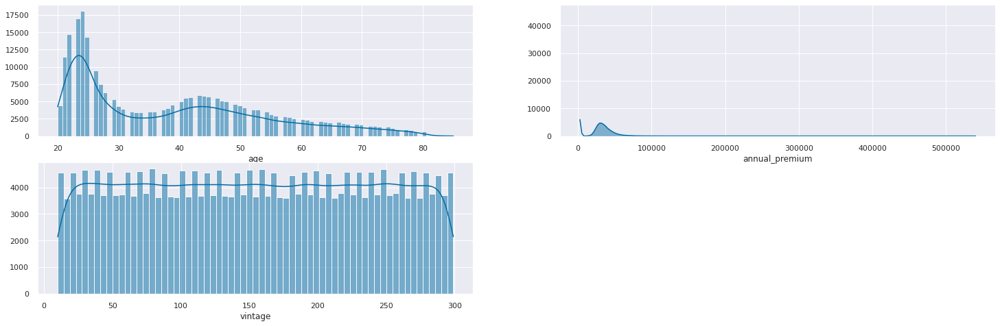

In [ ]:
multiple_histplots(x_train[['age', 'annual_premium','vintage']], 3, 2);

In [ ]:
# Min-Max Scaler
mms = MinMaxScaler()
rs = RobustScaler()

min_max_scaler = ['age', 'vintage']
robust_scaler = ['annual_premium']

for col in min_max_scaler:
    pickle.dump(mms, open(homepath + f'src/features/{col}_scaler.pkl', 'wb'))
    for dataframe in [x_train_imb, x_test, x_val]:
        dataframe[[col]] = mms.fit_transform(dataframe[[col]].values)

for col in robust_scaler:
    pickle.dump(rs, open(homepath + f'src/features/{col}_scaler.pkl', 'wb'))
    for dataframe in [x_train_imb, x_test, x_val]:
        dataframe[[col]] = rs.fit_transform(dataframe[[col]].values)

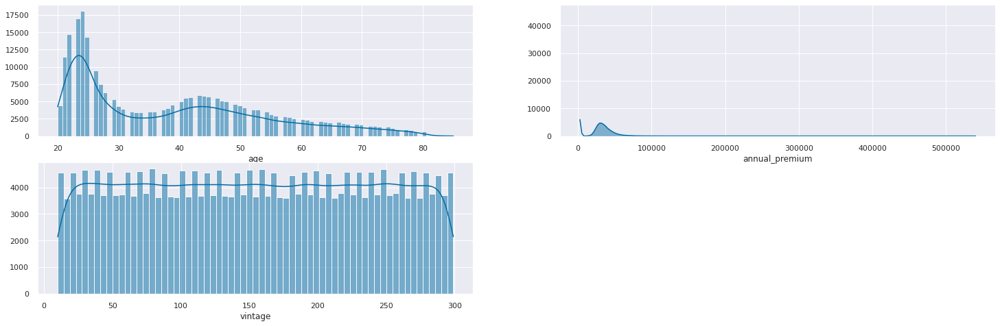

In [ ]:
multiple_histplots(x_train[['age', 'annual_premium','vintage']], 3, 2);

### 4.4 Split Data

In [ ]:
# target: response
y_train_imb, y_test, y_val = [dataframe['response'] for dataframe in [x_train_imb, x_test, x_val]]
ids_train, ids_test, ids_val = [dataframe['id'] for dataframe in [x_train_imb, x_test, x_val]]
X_train_imb, X_test, X_val = [dataframe.drop(columns = ['response', 'id']) for dataframe in [x_train_imb, x_test, x_val]]

X_train_imb.head()

,gender,age,region_code,policy_sales_channel,driving_license,vehicle_damage,previously_insured,annual_premium,vintage,premium_per_vintage,insurance_age,premium_per_age,car_age_below_1_year,car_age_between_1_2_year,car_age_over_2_years
0,0,0.292,0.048,0.210,1,1,0,-0.790,0.166,342.069,2,29028.159,0,1,0
1,1,0.385,0.005,0.194,1,1,0,0.947,0.512,290.570,2,31548.382,0,1,0
2,1,0.754,0.024,0.002,1,1,0,-0.425,0.585,141.469,4,34002.199,0,1,0
3,0,0.277,0.015,0.194,1,1,0,-1.937,0.201,38.676,2,28243.721,0,1,0
4,1,0.046,0.280,0.352,1,0,1,-0.082,0.142,597.412,5,30803.915,1,0,0


### 4.5 Balancing Target

In this sample, **the proportion of the response is 87.69% of not interested customer and 12.31%**. The target variable is imbalanced, a problem for Machine Learning, these algorithms are most effective with the most balanced data possible, something that rarely happens in reality. As it is a very extreme imbalance problem, the best choise is to use a form of balancing data, in this case, the method is called **Synthetic Minority Oversampling Technique** or just **SMOTE**, it uses a nearest neighbors algorithm to generate new synthetic points from the minority class.

[Reference](https://towardsdatascience.com/methods-for-dealing-with-imbalanced-data-5b761be45a18)

Before Resampling

In [ ]:
y_train_imb.value_counts(normalize = True) * 100

0   87.689
1   12.311
Name: response, dtype: float64

In [ ]:
synthetic_samples = SMOTETomek(sampling_strategy = 'minority', random_state = seed, n_jobs = 14)

X_train, y_train = synthetic_samples.fit_resample(X_train_imb, y_train_imb)

In [ ]:
y_train.value_counts(normalize = True) * 100

1   50.000
0   50.000
Name: response, dtype: float64

### 4.6 Feature Importance

#### 4.6.1 Feature Importance with ExtraTrees

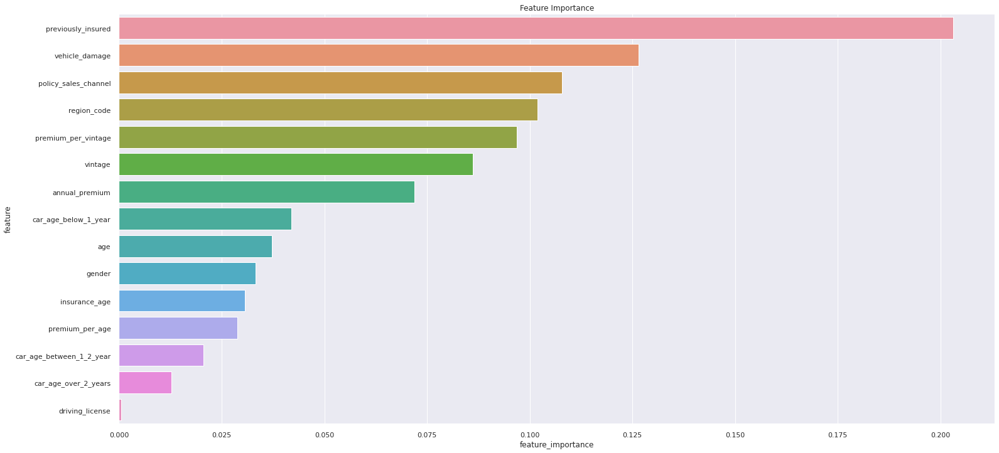

In [ ]:
et_importance = ExtraTreesClassifier(n_estimators = 100, random_state = seed, n_jobs = 14)
et_importance.fit(X_train, y_train)

# feature importance dataframe
feature_selection = pd.DataFrame({'feature': X_train.columns,'feature_importance': et_importance.feature_importances_})\
                                .sort_values('feature_importance', ascending = False).reset_index(drop = True)

# plot feature importance
ax = sns.barplot(x = 'feature_importance', y = 'feature', data = feature_selection, orient = 'h')
ax.set_title('Feature Importance');

#### 4.6.2 Feature Importance with RFE

In [ ]:
# feature selector
rf_selector = RandomForestClassifier(n_jobs = 14)
rfe = RFE(rf_selector, n_features_to_select = 8, step = 1)
rfe = rfe.fit(X_train, y_train)

# get ranking
rfe.support_

# selected columns
rfe_selected = X_train.loc[:, rfe.support_]
rfe_columns = rfe_selected.columns
rfe_columns

Index(['age', 'region_code', 'policy_sales_channel', 'vehicle_damage',
       'previously_insured', 'annual_premium', 'vintage',
       'premium_per_vintage'],
      dtype='object')

#### 4.6.3 Rank Features

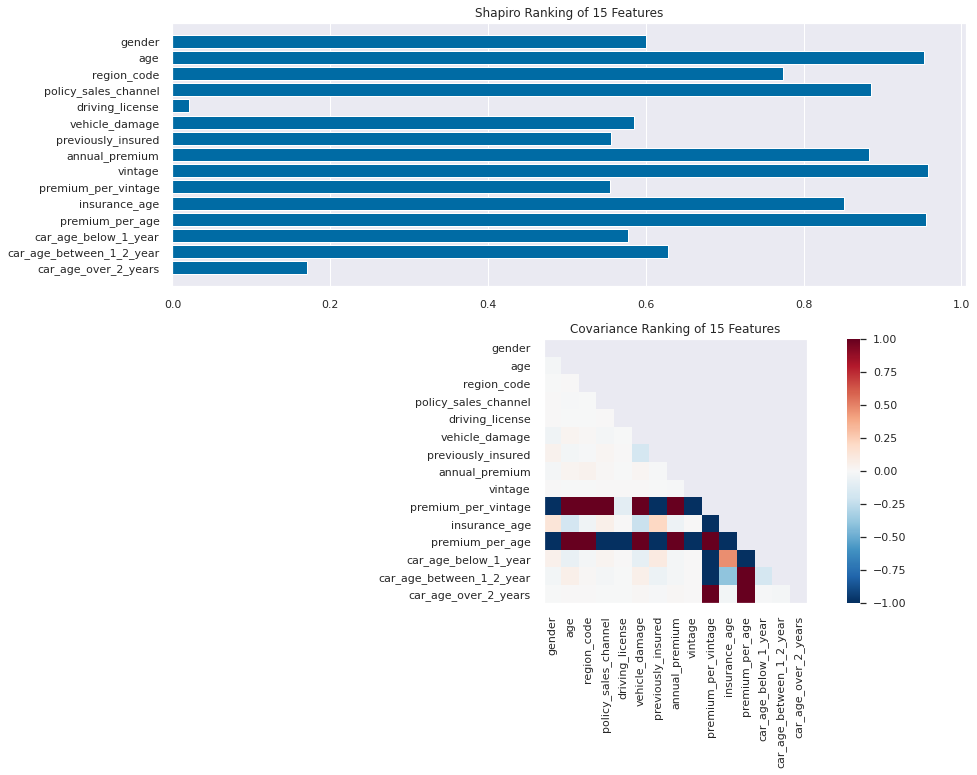

In [ ]:
plt.subplot(2, 1, 1)
visualizer_1d = Rank1D(algorithm = 'shapiro', size = (1024, 768))
visualizer_1d.fit(X_train, y_train)           
visualizer_1d.transform(X_train)        
visualizer_1d.finalize();

plt.subplot(2, 1, 2)
visualizer_2d = Rank2D(algorithm='covariance', size = (1024, 768))
visualizer_2d.fit(X_train, y_train)
visualizer_2d.transform(X_train)
visualizer_2d.finalize();

#### 4.6.4 Boruta

In [ ]:
rf_boruta = RandomForestClassifier(n_estimators = 500, n_jobs = 14, random_state = seed)

boruta = BorutaPy(rf_boruta, n_estimators = 'auto', random_state = seed).fit(X_train.values, y_train.values)

In [ ]:
cols_selected = boruta.support_.tolist()

cols_selected_boruta = X_train.iloc[:, cols_selected].columns.to_list()

cols_not_selected_boruta = list(np.setdiff1d(X_train.columns, cols_selected_boruta))

In [ ]:
cols_selected_boruta

['age',
 'region_code',
 'policy_sales_channel',
 'vehicle_damage',
 'previously_insured',
 'annual_premium',
 'vintage',
 'premium_per_vintage']

In [ ]:
cols_not_selected_boruta

['car_age_below_1_year',
 'car_age_between_1_2_year',
 'car_age_over_2_years',
 'driving_license',
 'gender',
 'insurance_age',
 'premium_per_age']

### 4.7 Feature Selection

These are the most relevant features of the FI-ET, FI-RFE, Rank Features and Boruta:

| Features                   | FI ExtraTrees | FI RFE    | Rank Features | Boruta |
| -------------------------- | ------------- | --------- | ------------- | ------ |
| `gender`                   |               |           |               |        |
| `age`                      |               | [x]       | [x]           |  [x]   |
| `region_code`              | [x]           | [x]       | [x]           |  [x]   |
| `policy_sales_channel`     | [x]           | [x]       | [x]           |  [x]   |
| `driving_license`          |               |           |               |        |
| `vehicle_damage`           | [x]           | [x]       |               |  [x]   |
| `previously_insured`       | [x]           | [x]       |               |  [x]   |
| `annual_premium`           | [x]           | [x]       | [x]           |  [x]   |
| `vintage`                  | [x]           | [x]       | [x]           |  [x]   |
| `premium_per_vintage`      | [x]           | [x]       |               |  [x]   |
| `insurance_age`            |               |           | [x]           |        |
| `premium_per_age`          |               |           | [x]           |        |
| `car_age_below_1_year`     | [x]           |           |               |        |
| `car_age_between_1_2_year` |               |           | [x]           |        |
| `car_age_over_2_years`     |               |           |               |        |

We can consider that if the feature appears in all models it is a important feature for the modelling step, in this scenario we have: 
- `region_code`
- `policy_sales_channel`
- `annual_premium` 
- `vintage`

In EDA, the features with the highest correlation with target `response` are:
- `vehicle_damage`
- `vehicle_age`
- `previously_insured`
- `age`
- `annual_premium`

Studying a little about the vehicle insurance business model, `age` and `gender` are the most relevant variables in a lot of cases.

With these three sources of information, I believe that the most relevant features for modeling models are:
- `gender`
- `age`
- `region_code`
- `policy_sales_channel`
- `vehicle_damage`
- `previously_insured`
- `annual_premium`
- `vintage`

In [ ]:
cols_drop_models = ['driving_license', 'premium_per_vintage', 'insurance_age', 'premium_per_age', 'car_age_below_1_year', 'car_age_between_1_2_year', 'car_age_over_2_years']

X_train, X_test, X_val = [dataframe.drop(columns = cols_drop_models) for dataframe in [X_train, X_test, X_val]]

### 4.8 Save State

In [ ]:
X_train.to_pickle(homepath + 'data/processed/X_train.pkl')
X_test.to_pickle(homepath + 'data/processed/X_test.pkl')
X_val.to_pickle(homepath + 'data/processed/X_val.pkl')
y_train.to_pickle(homepath + 'data/processed/y_train.pkl')
y_test.to_pickle(homepath + 'data/processed/y_test.pkl')
y_val.to_pickle(homepath + 'data/processed/y_val.pkl')
ids_train.to_pickle(homepath + 'data/processed/ids_train.pkl')
ids_test.to_pickle(homepath + 'data/processed/ids_test.pkl')
ids_val.to_pickle(homepath + 'data/processed/ids_val.pkl')

## 5. MACHINE LEARNING MODELLING

In this dataset, we have almost no relevant features for the prediction modelling, however, in this specific problem, the interest is not whether the person will buy a product or not, the main objective is to create a rank with a score for the customers most likely to accept an car insurance. The interest is to know the placement of customers on the probability list, a rank to learn problem.

With this particularity, metrics like precision, recall, f1-score don't represent the nature of the problem, We aren't interested in proving how good the model will be to making claims, the real goal is to know how good the model is for sorting a list, because of that, in rank to learn, sorting metrics are used, like precision at k, recall at k, cumulative gain and lift curve.

### 5.1 Dataset Checkpoint

In [22]:
X_train = pd.read_pickle(homepath + 'data/processed/X_train.pkl')
X_val = pd.read_pickle(homepath + 'data/processed/X_val.pkl')
y_train = pd.read_pickle(homepath + 'data/processed/y_train.pkl')
y_val = pd.read_pickle(homepath + 'data/processed/y_val.pkl')

### 5.2 Models

In [23]:
models = [LogisticRegression(random_state = seed),
          RandomForestClassifier(random_state = seed, n_jobs = 14),
          ExtraTreesClassifier(random_state = seed, n_jobs = 14),
          GaussianNB(),
          XGBClassifier(random_state = seed, n_jobs = 14, eval_metric = 'logloss', use_label_encoder = False),
          CatBoostClassifier(random_state = seed, verbose = False),
          AdaBoostClassifier(random_state = seed),
          LGBMClassifier(random_state = seed, n_jobs = 14),
          KNeighborsClassifier(n_neighbors = 7, n_jobs = 14),
          GradientBoostingClassifier(random_state = seed)
         ]

### 5.3 Prediction @k and Recall @k

**Precision at K**: Of all the examples I predicted to be true, how many were actually true? This metric count how many predictions were correct up to k and divide by all predictions made by the model up to k.

**Recall at K**: Of all the examples that are actually true, how many have I predicted to be true? This metric count how many predictions were correct up to k and divide by all true examples.

In [24]:
metrics_result = metrics_at_k(models, 'response', X_train, y_train, X_val, y_val)

Please, wait a moment - Doing ML
Training model 1/10 -> LogisticRegression
Training model 2/10 -> RandomForestClassifier
Training model 3/10 -> ExtraTreesClassifier
Training model 4/10 -> GaussianNB
Training model 5/10 -> XGBClassifier
Training model 6/10 -> CatBoostClassifier
Training model 7/10 -> AdaBoostClassifier
Training model 8/10 -> LGBMClassifier
Training model 9/10 -> KNeighborsClassifier
Training model 10/10 -> GradientBoostingClassifier
Finished, check the results


In [25]:
metrics_result

,Model_Name,Precision @K,Recall @K,ROCAUC
0,LogisticRegression,0.229,0.993,0.807
0,RandomForestClassifier,0.224,0.972,0.816
0,ExtraTreesClassifier,0.228,0.988,0.826
0,GaussianNB,0.229,0.993,0.821
0,XGBClassifier,0.223,0.966,0.791
0,CatBoostClassifier,0.216,0.935,0.797
0,AdaBoostClassifier,0.228,0.989,0.811
0,LGBMClassifier,0.227,0.985,0.805
0,KNeighborsClassifier,0.221,0.961,0.800
0,GradientBoostingClassifier,0.224,0.970,0.807


### 5.4 Cross Validation

In [26]:
cv_result = cross_validation(models, 'response', X_train, y_train)

Please, wait a moment, Doing CV
Folding model 1/10 -> LogisticRegression
Folding model 2/10 -> RandomForestClassifier
Folding model 3/10 -> ExtraTreesClassifier
Folding model 4/10 -> GaussianNB
Folding model 5/10 -> XGBClassifier
Folding model 6/10 -> CatBoostClassifier
Folding model 7/10 -> AdaBoostClassifier
Folding model 8/10 -> LGBMClassifier
Folding model 9/10 -> KNeighborsClassifier
Folding model 10/10 -> GradientBoostingClassifier
Finished, check the results


In [27]:
result = pd.merge(metrics_result, cv_result, on = 'Model_Name')

In [28]:
result.style.apply(highlight_max)

,Model_Name,Precision @K,Recall @K,ROCAUC,Precision @K Mean,Precision @K STD,Recall @K Mean,Recall @K STD,ROCAUC @K Mean,ROCAUC @K STD
0,LogisticRegression,0.229089,0.993495,0.806893,0.790000,0.001000,0.355000,0.001000,0.355000,0.001000
1,RandomForestClassifier,0.224189,0.972246,0.815870,0.895000,0.105000,0.402000,0.047000,0.402000,0.047000
2,ExtraTreesClassifier,0.227739,0.987641,0.826072,0.930000,0.099000,0.417000,0.044000,0.417000,0.044000
3,GaussianNB,0.228889,0.992628,0.820977,0.907000,0.094000,0.407000,0.042000,0.407000,0.042000
4,XGBClassifier,0.222689,0.965742,0.791156,0.926000,0.092000,0.416000,0.041000,0.416000,0.041000
5,CatBoostClassifier,0.215689,0.935386,0.797041,0.938000,0.088000,0.421000,0.040000,0.421000,0.040000
6,AdaBoostClassifier,0.227939,0.988508,0.811138,0.947000,0.084000,0.425000,0.038000,0.425000,0.038000
7,LGBMClassifier,0.227089,0.984822,0.805001,0.954000,0.081000,0.428000,0.036000,0.428000,0.036000
8,KNeighborsClassifier,0.221489,0.960538,0.799846,0.949000,0.077000,0.426000,0.035000,0.426000,0.035000
9,GradientBoostingClassifier,0.223589,0.969644,0.806991,0.954000,0.075000,0.428000,0.034000,0.428000,0.034000


### 5.5 Cumulative Gain and Lift Curve

**Cumulative gain**: X% of the customer base, ordered by probability of purchase contains Y% of everyone interested in the new product.

**Lift Curve**: How many times the ML model is batter than a baseline model for each % of base?

Calulating curve for model 1/10 -> LogisticRegression
Training model ... 
Calulating curve for model 2/10 -> RandomForestClassifier
Training model ... 
Calulating curve for model 3/10 -> ExtraTreesClassifier
Training model ... 
Calulating curve for model 4/10 -> GaussianNB
Training model ... 
Calulating curve for model 5/10 -> XGBClassifier
Training model ... 
Calulating curve for model 6/10 -> CatBoostClassifier
Training model ... 
Calulating curve for model 7/10 -> AdaBoostClassifier
Training model ... 
Calulating curve for model 8/10 -> LGBMClassifier
Training model ... 
Calulating curve for model 9/10 -> KNeighborsClassifier
Training model ... 
Calulating curve for model 10/10 -> GradientBoostingClassifier
Training model ... 
Here are your curves:


<module 'matplotlib.pyplot' from '/home/gutto/.pyenv/versions/3.9.9/envs/cross_sell/lib/python3.9/site-packages/matplotlib/pyplot.py'>

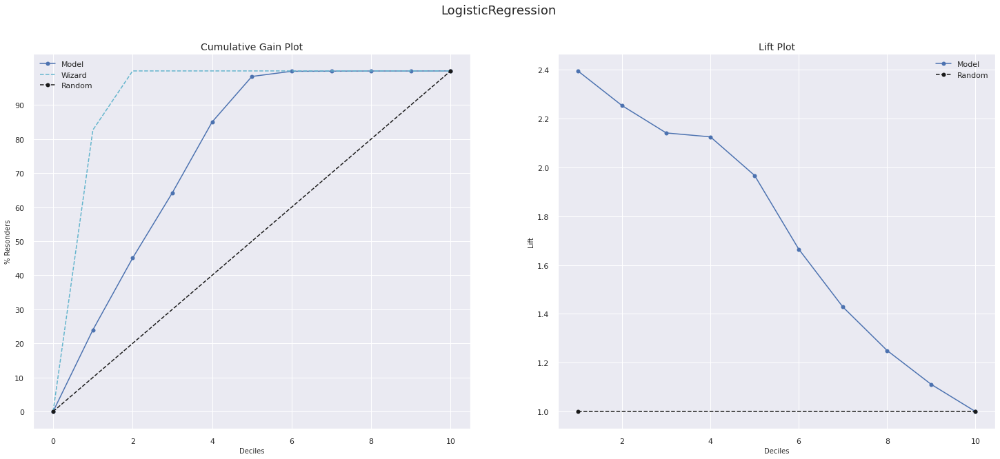

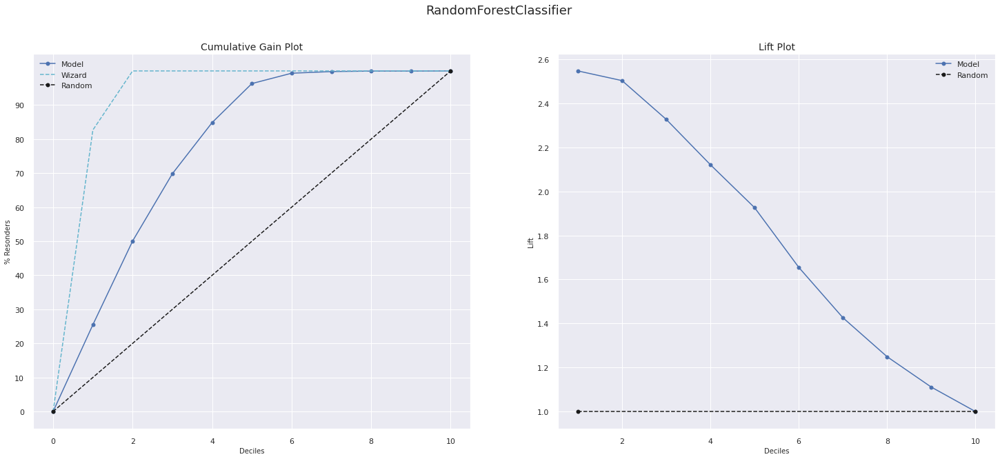

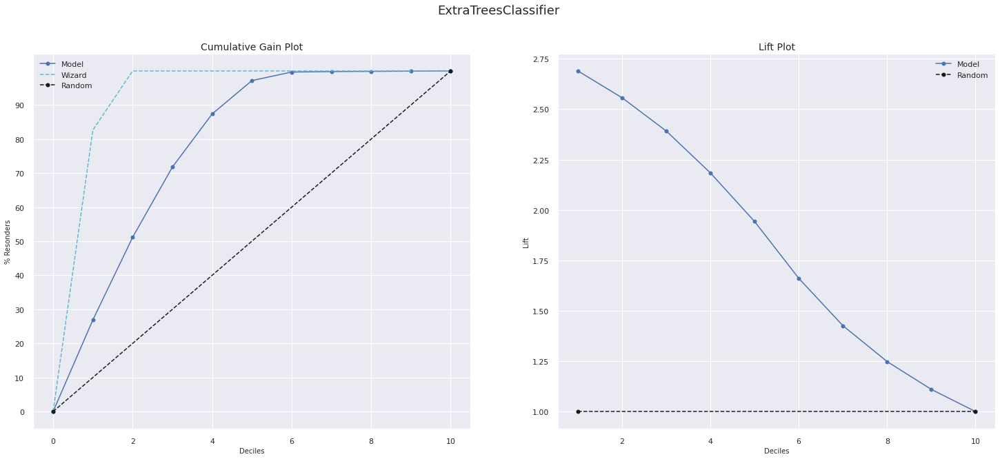

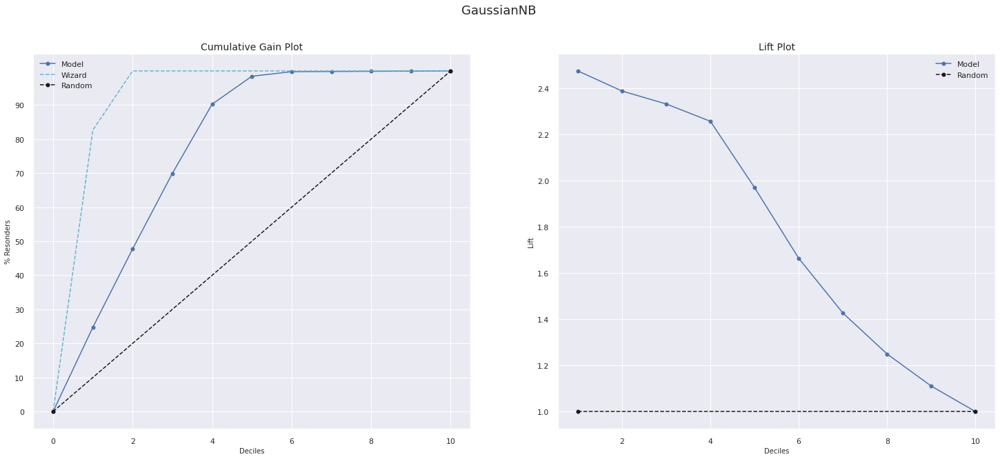

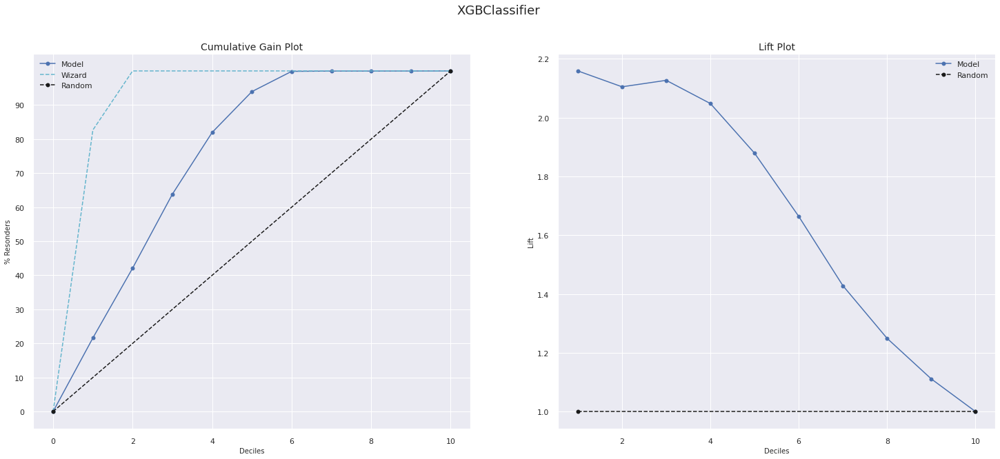

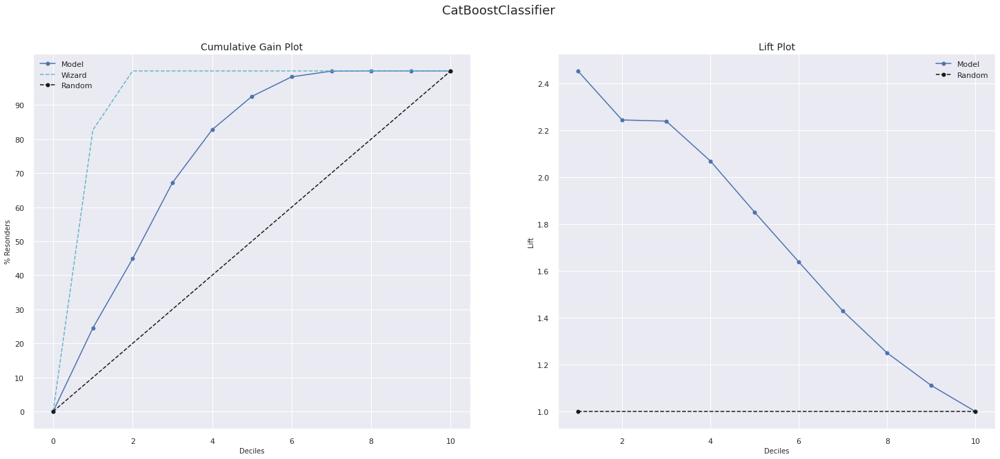

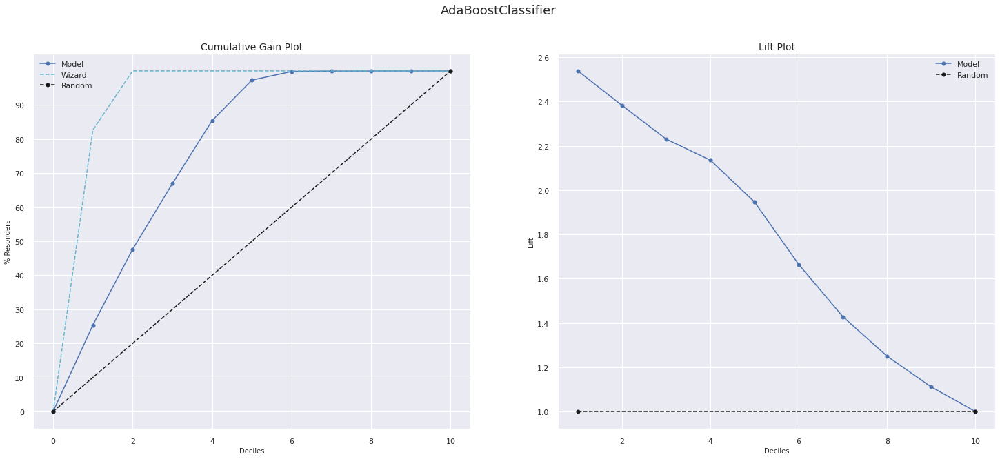

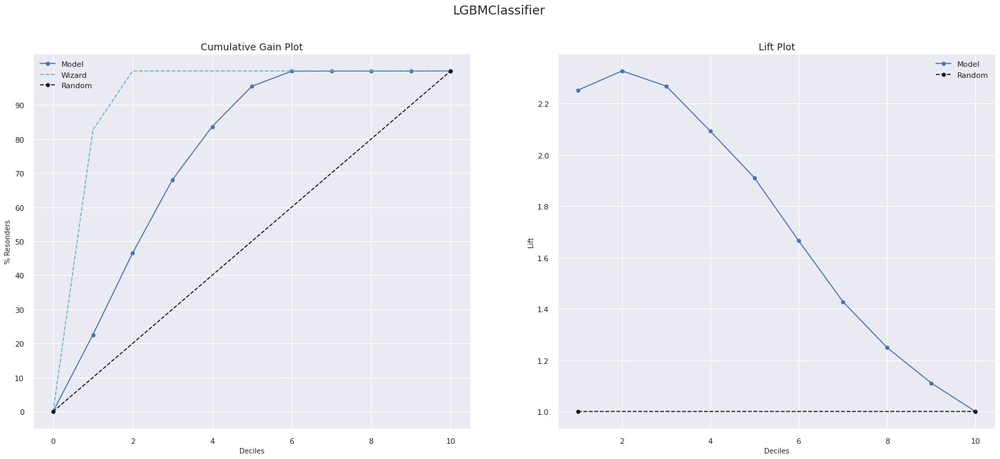

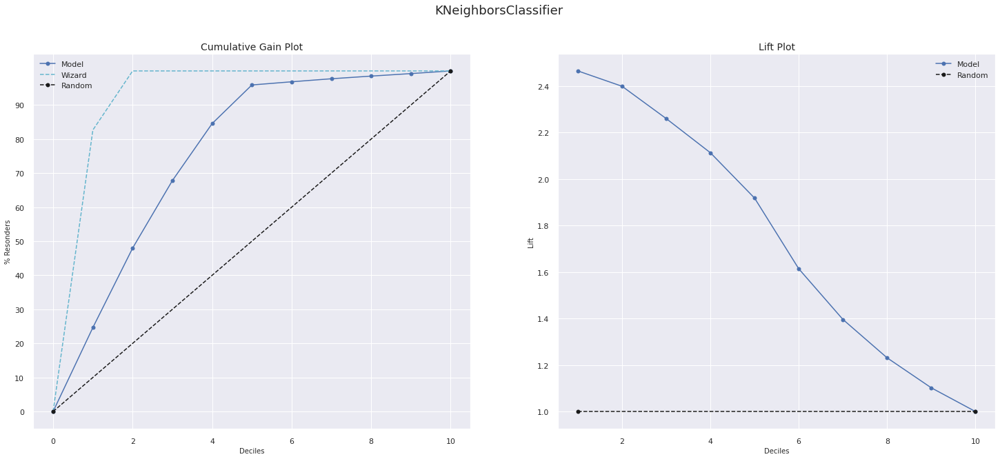

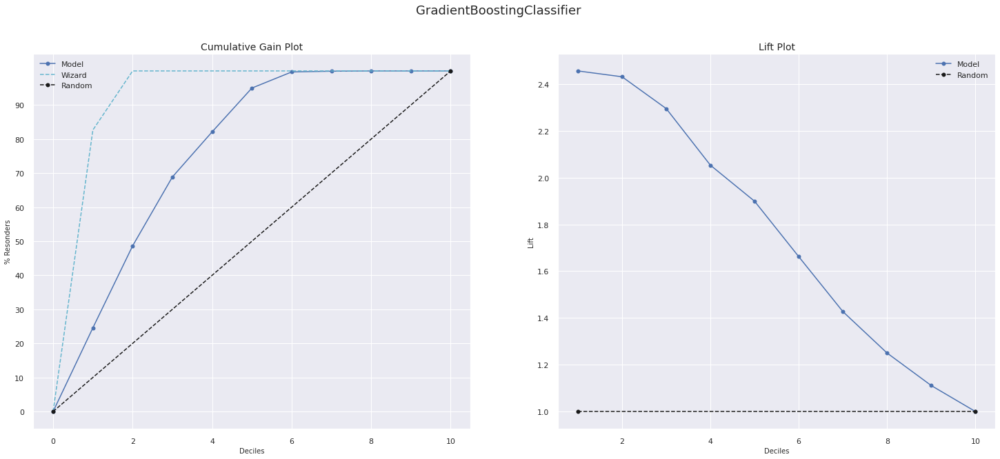

In [29]:
ranking_plots(models, X_train, y_train, X_val, y_val)

## 6. HYPERPARAMETER FINE TUNNING

### 6.1 Dataset Checkpoint

In [50]:
X_train = pd.read_pickle(homepath + 'data/processed/X_train.pkl')
X_val = pd.read_pickle(homepath + 'data/processed/X_val.pkl')
y_train = pd.read_pickle(homepath + 'data/processed/y_train.pkl')
y_val = pd.read_pickle(homepath + 'data/processed/y_val.pkl')

### 6.2 Bayesian Search

Bayesian Optimization provides a principled technique based on Bayes Theorem to direct a search of a global optimization problem that is efficient and effective.

#### 6.2.1 LGBM Classifier

In [23]:
study_lgbm = optuna.create_study(direction = 'minimize', study_name = 'LGBM')
func = lambda trial: objective_lgbm(trial, X_train, y_train)
study_lgbm.optimize(func, n_trials = 70)

[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=9.734519432281637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.734519432281637
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will 

In [24]:
optuna.visualization.plot_optimization_history(study_lgbm)

In [25]:
optuna.visualization.plot_param_importances(study_lgbm)

In [26]:
print(f"\tBest value (log loss): {study_lgbm.best_value}")
print(f"\tBest params:")

for key, value in study_lgbm.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (log loss): 0.18368350612598797
	Best params:
		n_estimators: 1900
		learning_rate: 0.29167114416806517
		num_leaves: 1100
		max_depth: 10
		min_data_in_leaf: 200
		lambda_l1: 10
		lambda_l2: 15
		min_gain_to_split: 0.25669872352588197
		bagging_fraction: 0.5
		bagging_freq: 1
		feature_fraction: 0.7


#### 6.2.2 AdaBoost Classifier

In [27]:
study_adb = optuna.create_study(direction = 'minimize', study_name = 'AdaBoost')
func = lambda trial: objective_adb(trial, X_train, y_train)
study_adb.optimize(func, n_trials = 70, n_jobs = 15)

In [28]:
optuna.visualization.plot_optimization_history(study_adb)

In [29]:

optuna.visualization.plot_param_importances(study_adb)

In [30]:
print(f"\tBest value (log loss): {study_adb.best_value}")
print(f"\tBest params:")

for key, value in study_adb.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (log loss): 0.5752824732062852
	Best params:
		n_estimators: 500
		learning_rate: 0.014717491827067917


#### 6.2.3 ExtraTrees Classifier

In [31]:
study_et = optuna.create_study(direction = 'minimize', study_name = 'ExtraTrees')
func = lambda trial: objective_et(trial, X_train, y_train)
study_et.optimize(func, n_trials = 70, n_jobs = 15)

In [32]:

optuna.visualization.plot_optimization_history(study_et)

In [33]:
optuna.visualization.plot_param_importances(study_et)

In [34]:
print(f"\tBest value (log loss): {study_et.best_value}")
print(f"\tBest params:")

for key, value in study_et.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (log loss): 0.34868667894109784
	Best params:
		n_estimators: 300
		max_features: sqrt
		max_depth: 12
		min_samples_split: 7
		min_samples_leaf: 2


#### 6.2.4 GrandientBoosting Classifier

In [35]:
study_gb = optuna.create_study(direction = 'minimize', study_name = 'GradientBoosting')
func = lambda trial: objective_gb(trial, X_train, y_train)
study_gb.optimize(func, n_trials = 70, n_jobs = 15)

In [36]:
optuna.visualization.plot_optimization_history(study_gb)

In [37]:
optuna.visualization.plot_param_importances(study_gb)

In [38]:
print(f"\tBest value (log loss): {study_gb.best_value}")
print(f"\tBest params:")

for key, value in study_gb.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (log loss): 0.16001876640722154
	Best params:
		n_estimators: 1800
		learning_rate: 0.21580404007474752
		max_depth: 4
		min_samples_split: 8
		min_samples_leaf: 3


### 6.3 Models Performance

In [29]:
models = [
          ExtraTreesClassifier(random_state = seed, n_jobs = -1, n_estimators = 300, max_features = 'sqrt', max_depth = 12, min_samples_split = 7, min_samples_leaf = 2),
          AdaBoostClassifier(random_state = seed, n_estimators = 1900, learning_rate = 0.2916711441680651),
          LGBMClassifier(random_state = seed, n_jobs = -1, n_estimators = 1900, learning_rate = 0.29167114416806517, num_leaves = 1100, max_depth = 10, min_data_in_leaf = 200, lambda_l1 = 10, lambda_l2 = 15, min_gain_to_split = 0.25669872352588197, bagging_fraction = 0.5, bagging_freq = 1, feature_fraction = 0.7),
          GradientBoostingClassifier(random_state = seed, n_estimators = 1800, learning_rate = 0.21580404007474752, max_depth = 4, min_samples_split = 8, min_samples_leaf = 3)
         ]

In [31]:
metrics_tunned = metrics_at_k(models, 'response', X_train, y_train, X_val, y_val)
cv_tunned = cross_validation(models, 'response', X_train, y_train)
result_tunned = pd.merge(metrics_tunned, cv_tunned, on = 'Model_Name')
result_tunned.style.apply(highlight_max)

Please, wait a moment - Doing ML
Training model 1/4 -> ExtraTreesClassifier
Training model 2/4 -> AdaBoostClassifier
Training model 3/4 -> LGBMClassifier
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_gain_to_split is set=0.25669872352588197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25669872352588197
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
Training model

,Model_Name,Precision @K,Recall @K,ROCAUC,Precision @K Mean,Precision @K STD,Recall @K Mean,Recall @K STD,ROCAUC @K Mean,ROCAUC @K STD
0,ExtraTreesClassifier,0.229189,0.993929,0.828884,0.973000,0.002000,0.437000,0.001000,0.437000,0.001000
1,AdaBoostClassifier,0.222689,0.965742,0.800518,0.986000,0.014000,0.443000,0.006000,0.443000,0.006000
2,LGBMClassifier,0.211339,0.916522,0.789651,0.991000,0.013000,0.445000,0.006000,0.445000,0.006000
3,GradientBoostingClassifier,0.214239,0.929098,0.777348,0.993000,0.012000,0.446000,0.005000,0.446000,0.005000


In [32]:
yhat_list = []
for model in models:
    model.fit(X_train, y_train)
    yhat_full = model.predict_proba(X_val)
    yhat = yhat_full[:,1]
    yhat_list.append(yhat)

[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_gain_to_split is set=0.25669872352588197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25669872352588197
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15


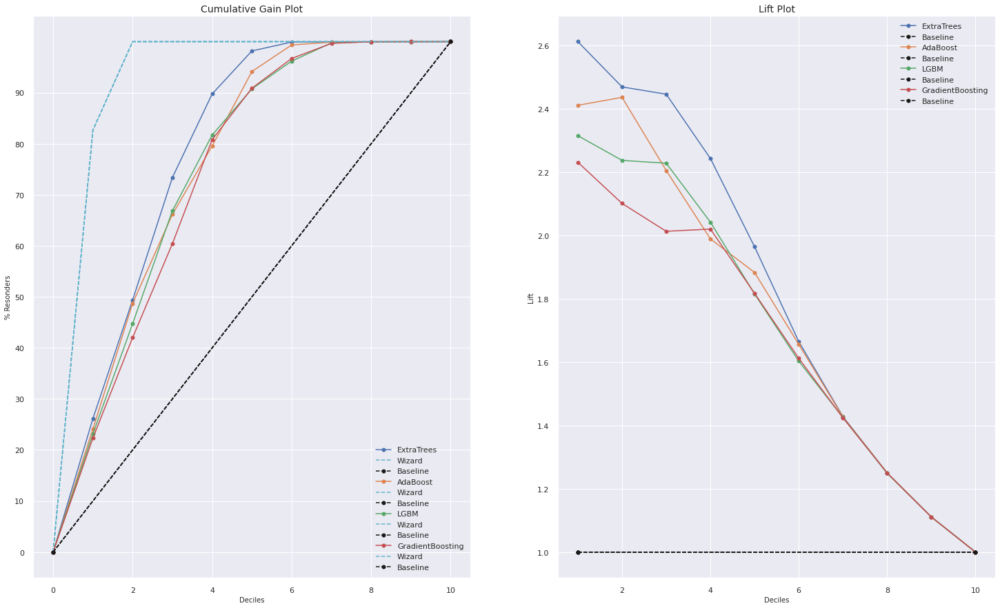

In [33]:
fig, ax = plt.subplots(figsize = (25, 15))

plt.subplot(1, 2, 1)
plot_cumulative_gain(y_val, yhat_list[0])
plot_cumulative_gain(y_val, yhat_list[1])
plot_cumulative_gain(y_val, yhat_list[2])
plot_cumulative_gain(y_val, yhat_list[3])
plt.yticks(np.arange(0, 100, step = 10));
plt.legend(['ExtraTrees', 'Wizard', 'Baseline' , 'AdaBoost', 'Wizard', 'Baseline', 'LGBM', 'Wizard', 'Baseline', 'GradientBoosting', 'Wizard', 'Baseline'])

plt.subplot(1, 2, 2)
plot_lift(y_val, yhat_list[0])
plot_lift(y_val, yhat_list[1])
plot_lift(y_val, yhat_list[2])
plot_lift(y_val, yhat_list[3])
plt.legend(['ExtraTrees', 'Baseline', 'AdaBoost', 'Baseline', 'LGBM', 'Baseline', 'GradientBoosting', 'Baseline'])

#saving figure
plt.savefig(homepath + 'reports/figures/model_results')

### 6.4 Final Model

In [59]:
# concat
df6 = pd.concat([x_train, x_val], ignore_index = True)
cols_drop = ['driving_license', 'premium_per_vintage', 'insurance_age', 'premium_per_age', 'car_age_below_1_year', 'car_age_between_1_2_year', 'car_age_over_2_years']
df_final = data_preparation(df6, cols_drop)

# split
y_train_full = df_final['response']
ids_train_full = df_final['id']
X_train_full = df_final.drop(columns = ['response', 'id'])

# save pickle
X_train_full.to_pickle(homepath + 'data/processed/X_train_full.pkl')
y_train_full.to_pickle(homepath + 'data/processed/y_train_full.pkl')
ids_train_full.to_pickle(homepath + 'data/processed/ids_train_full.pkl')

In [60]:
X_train_full = pd.read_pickle(homepath + 'data/processed/X_train_full.pkl')
y_train_full = pd.read_pickle(homepath + 'data/processed/y_train_full.pkl')


final_model = ExtraTreesClassifier(random_state = seed, n_jobs = -1, n_estimators = 300, max_features = 'sqrt', max_depth = 12, min_samples_split = 7, min_samples_leaf = 2)
final_model.fit(X_train, y_train)
pickle.dump(final_model, open(homepath + '/models/cross_sell.pkl', 'wb'))

## 7. BUSINESS TRANSLATION

### 7.1 Dataset Checkpoint

In [67]:
X_test = pd.read_pickle(homepath + 'data/processed/X_test.pkl')
y_test = pd.read_pickle(homepath + 'data/processed/y_test.pkl')
df7 = pd.read_pickle(homepath + 'data/processed/X_test.pkl')
df7['id'] = pd.read_pickle(homepath + 'data/processed/ids_test.pkl')
df7['response'] = pd.read_pickle(homepath + 'data/processed/y_test.pkl')

# loading model
model = pickle.load(open(homepath + '/models/cross_sell.pkl', 'rb'))

# testing model
yhat = model.predict_proba(X_test)
df7['score'] = yhat[:, 1].tolist()

df7 = df7.sort_values('score', ascending = False)

df7 = df7.reset_index(drop = True)
df7['ranking'] = df7.index+1
df7['precision_at_k'] = df7['response'].cumsum()/df7['ranking']
df7['recall_at_k'] = df7['response'].cumsum()/df7['response'].sum()

### 7.2 Insights with the most relevant attributes of customers interested in purchasing auto insurance.

#### Insight 1: Interested customers have between 35 and 55 years old.

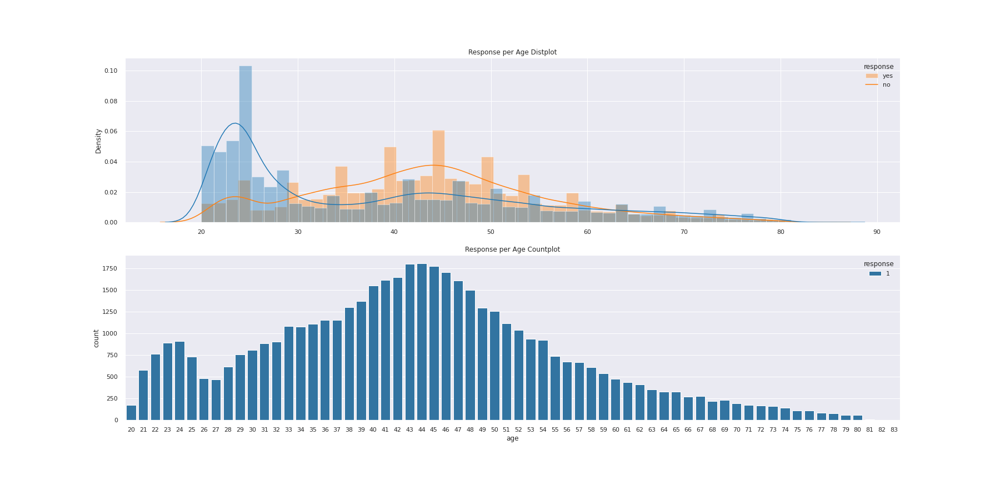

In [61]:
Image(homepath + 'reports/figures/h5.png')

#### Insight 2: Customers with vehicles with age between 1-2 years have much more interest (74.52%) than people who have a vehicle for less than 1 year.

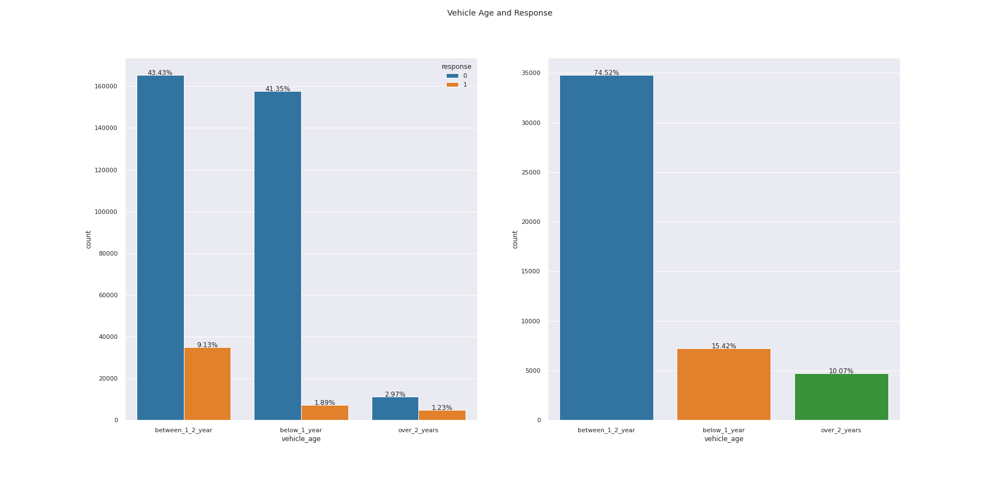

In [62]:
Image(homepath + 'reports/figures/h7.png')

#### Insight 3: Customer that paid between $25000-$44999 represents 57.13% of the total interested customers.

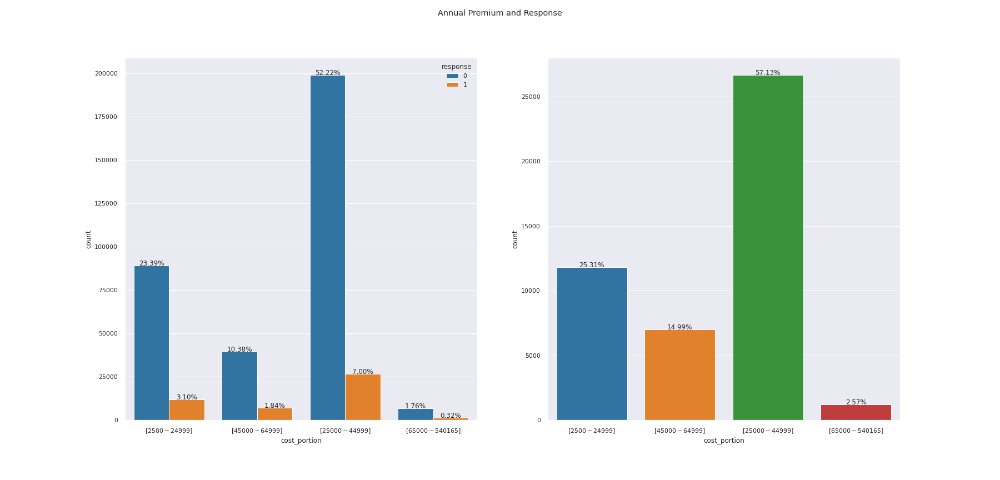

In [63]:
Image(homepath + 'reports/figures/h8.png')

#### The most relevant attributes to define a customer interest are:
- Age
- Region Code
- Policy Sales Channel
- Vehicle Damage
- Previously Insured
- Annual Premium
- Vintage

### 7.3 What percentage of interested customers the sales team will be able to contact making 20,000 calls?
**64.618% of the interested customers.** With the proposed model, the result is aprox. 2.45 times better than a random choise.

Using 26.239% of the test data, the model could find 65.806% of the total customers interested in purchase a car insurance.


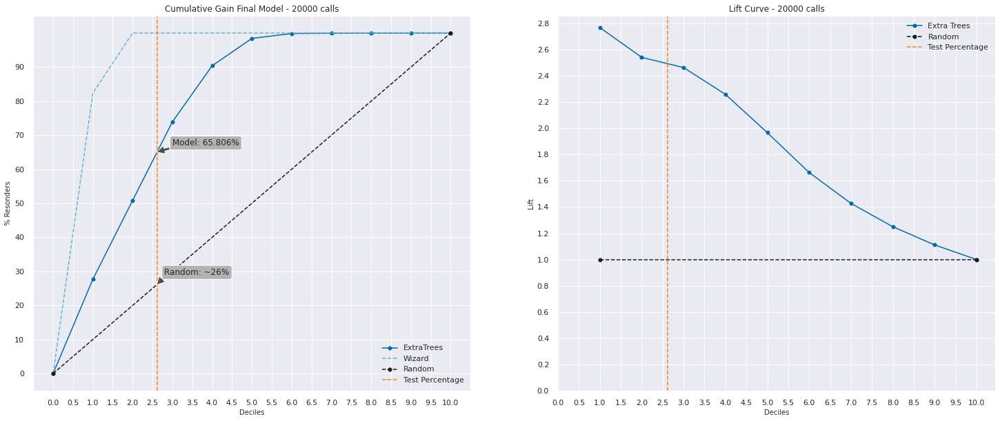

In [76]:
percent = round((20000/len(df7)*100), 3)
recall_at_20000 = round(recall_at_k(df7, 'response'), 3)

print(f'Using {percent}% of the test data, the model could find {recall_at_20000}% of the total customers interested in purchase a car insurance.')

fig, ax = plt.subplots(figsize = (25, 10))

plt.subplot(1, 2, 1)
plot_cumulative_gain(y_test, yhat[:,1])
plt.axvline(2.6239, color ='#FF7F0E', ls = '--')
plt.title('Cumulative Gain Final Model - 20000 calls')
plt.yticks(np.arange(0, 100, step = 10))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['ExtraTrees', 'Wizard', 'Random', 'Test Percentage'])

bbox = dict(boxstyle ='round', fc ='0.7')
arrowprops = dict(facecolor ='#4D4D4D')
plt.annotate('Model: 65.806%', xy = (2.6, 65),
                xytext =(3, 67), 
                arrowprops = arrowprops, bbox = bbox)

plt.annotate('Random: ~26%', xy = (2.6, 26),
                xytext =(2.8, 29), 
                arrowprops = arrowprops, bbox = bbox);



plt.subplot(1, 2, 2)
plot_lift(y_test, yhat[:,1])
plt.axvline(2.6239, color ='#FF7F0E', ls = '--')
plt.title('Lift Curve - 20000 calls')
plt.yticks(np.arange(0, 3, step = 0.2))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['Extra Trees', 'Random', 'Test Percentage']);

#saving figure
plt.savefig(homepath + 'reports/figures/20000_calls.png')

In [73]:
random = (26/100)*len(df7)
model = (64/100)*len(df7)

revenue_random = random*1000
revenue_model = model*1000

print(f'${int(revenue_random)}.00 revenue with random choice')
print(f'${int(revenue_model)}.00 revenue with proposed model')

print(f'The difference is ${int(revenue_model-revenue_random)}.00')

$19817720.00 revenue with random choice
$48782080.00 revenue with proposed model
The difference is $28964360.00


### 7.4 By increasing the capacity to 40,000 calls, what percentage of interested customers the sales team will be able to contact?
**99.298% of the interested customers.** With the proposed model, the result is aprox. 1.9 times better than a random choise.


Using 52.478% of the test data, the model could find 99.298% of the total customers interested in purchase a car insurance.


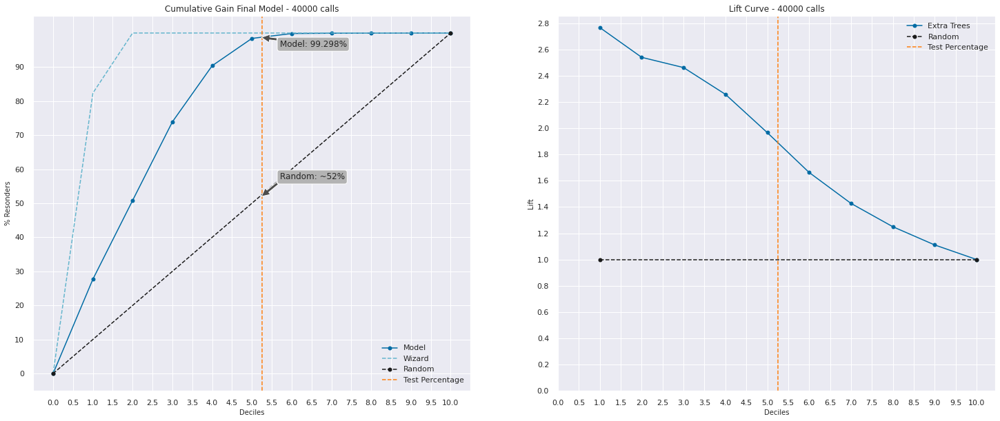

In [75]:
percent_40000 = round((40000/len(df7)*100), 3)
recall_at_40000 = round(recall_at_k(df7, 'response', k = 40000), 3)

print(f'Using {percent_40000}% of the test data, the model could find {recall_at_40000}% of the total customers interested in purchase a car insurance.')

fig, ax = plt.subplots(figsize = (25, 10))

plt.subplot(1, 2, 1)
plot_cumulative_gain(y_test, yhat[:,1])
plt.axvline(5.2478, color ='#FF7F0E', ls = '--')
plt.title('Cumulative Gain Final Model - 40000 calls')
plt.yticks(np.arange(0, 100, step = 10))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['Model', 'Wizard', 'Random', 'Test Percentage'])

bbox = dict(boxstyle ='round', fc ='0.7')
arrowprops = dict(facecolor ='#4D4D4D')
plt.annotate('Model: 99.298%', xy = (5.24, 98.7),
                xytext =(5.7, 96), 
                arrowprops = arrowprops, bbox = bbox);

plt.annotate('Random: ~52%', xy = (5.24, 52),
                xytext =(5.7, 57), 
                arrowprops = arrowprops, bbox = bbox);


plt.subplot(1, 2, 2)
plot_lift(y_test, yhat[:,1])
plt.axvline(5.2478, color ='#FF7F0E', ls = '--')
plt.title('Lift Curve - 40000 calls')
plt.yticks(np.arange(0, 3, step = 0.2))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['Extra Trees', 'Random', 'Test Percentage']);

#saving figure
plt.savefig(homepath + 'reports/figures/40000_calls.png')

In [77]:
random = (52/100)*len(df7)
model = (99/100)*len(df7)

revenue_random = random*1000
revenue_model = model*1000

print(f'${int(revenue_random)}.00 revenue with random choice')
print(f'${int(revenue_model)}.00 revenue with proposed model')

print(f'The difference is ${int(revenue_model-revenue_random)}.00')

$39635440.00 revenue with random choice
$75459780.00 revenue with proposed model
The difference is $35824340.00


### 7.5 How many calls does sales team need to make to reach 80% of the most likely customers to purchase the car insurance?
**The Marketing team will call 80% of the interested customers if they make 25,647 phone calls.**

In [78]:
percent_80 = df7[df7['recall_at_k'] >= 0.800].index.min()
percent_80

25199

Using 33.06% of the test data, the model could find 80.002% of the total customers interested in purchase a car insurance.


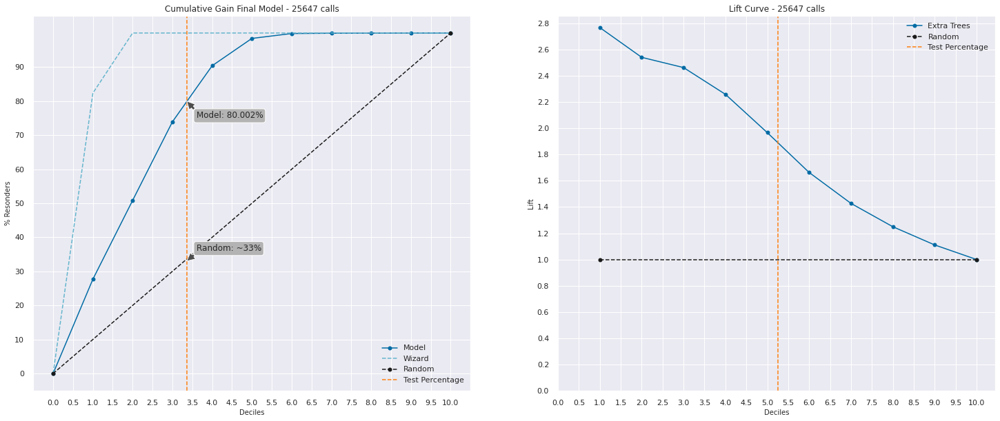

In [79]:
percent = round((25199/len(df7)*100), 3)
recall = round(recall_at_k(df7, 'response', k = 25199), 3)

print(f'Using {percent}% of the test data, the model could find {recall}% of the total customers interested in purchase a car insurance.')

fig, ax = plt.subplots(figsize = (25, 10))

plt.subplot(1, 2, 1)
plot_cumulative_gain(y_test, yhat[:,1])
plt.axvline(3.3648, color ='#FF7F0E', ls = '--')
plt.title('Cumulative Gain Final Model - 25647 calls')
plt.yticks(np.arange(0, 100, step = 10))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['Model', 'Wizard', 'Random', 'Test Percentage'])

bbox = dict(boxstyle ='round', fc ='0.7')
arrowprops = dict(facecolor ='#4D4D4D')
plt.annotate('Model: 80.002%', xy = (3.36, 80),
                xytext =(3.6, 75), 
                arrowprops = arrowprops, bbox = bbox);

plt.annotate('Random: ~33%', xy = (3.36, 33),
                xytext =(3.6, 36), 
                arrowprops = arrowprops, bbox = bbox);


plt.subplot(1, 2, 2)
plot_lift(y_test, yhat[:,1])
plt.axvline(5.2478, color ='#FF7F0E', ls = '--')
plt.title('Lift Curve - 25647 calls')
plt.yticks(np.arange(0, 3, step = 0.2))
plt.xticks(np.arange(0, 10.5, step = 0.5))
plt.legend(['Extra Trees', 'Random', 'Test Percentage']);

#saving figure
plt.savefig(homepath + 'reports/figures/80_percent.png')

In [80]:
random = (33/100)*len(df7)
model = (80/100)*len(df7)

revenue_random = random*1000
revenue_model = model*1000

print(f'${int(revenue_random)}.00 revenue with random choice')
print(f'${int(revenue_model)}.00 revenue with proposed model')

print(f'The difference is ${int(revenue_model-revenue_random)}.00')

$25153260.00 revenue with random choice
$60977600.00 revenue with proposed model
The difference is $35824340.00
